# **ELIXIR Spatial Transcriptomics Course**

Author: George Gavriilidis

Date: 2025-02-22

Author email: ggeorav@certh.gr

# Practical 2: Quality Control and Visualisation for Sequence-based data analysis

### Quiz: Pre-Workshop Check


1. What is the importance of QC metrics on spatial data?

2. Evaluating library size - why?

3. Thresholding across various QC metrics - how to decide?

4. Cells per spot - why does it matter?

5. Mitochondria - what do they represent for QC?

6. Normalisation - why do we need that for downstream analysis?

7. Spotting Highly Variable Genes - does it matter and how QC is important?

8. What are some advanced visualisations that `SpatialData` can facilitate for sequence-based analysis?

Take a moment to reflect on these questions before moving on to the hands-on exercises.


# Dependencies

In [ ]:
# !pip install 'squidpy[interactive]'

In [ ]:
# !pip install fsspec==2024.10.0 gcsfs==2024.10.0

In [1]:
from spatialdata_io import visium, visium_hd, xenium

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


In [1]:
data_path = "./data/"

In [2]:
import spatialdata as sd
import spatialdata_plot as sdp
from spatialdata_io import visium, visium_hd, xenium
import matplotlib.pyplot as plt  # for multi-panel plots later

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


In [3]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import squidpy as sq

In [4]:
sc.settings.verbosity = 3

In [5]:
!pwd

/Users/georgegavriilidis/Downloads


# 2.0 Load Visium dataset

In [ ]:
# import os

# # Define the folder path you want to create
# folder_path = "./data/visium_coronal/"

# # Create the folder path
# try:
#     os.makedirs(folder_path, exist_ok=True)
#     print(f"Folder path '{folder_path}' created successfully.")
# except Exception as e:
#     print(f"An error occurred while creating the folder path: {e}")

In [ ]:
# # Download the .h5 file
# !wget -O ./data/visium_coronal/V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5 \
# https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Adult_Mouse_Brain/V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5

# # Download the spatial.tar.gz file
# !wget -O ./data/visium_coronal/V1_Adult_Mouse_Brain_spatial.tar.gz \
# https://cf.10xgenomics.com/samples/spatial-exp/1.1.0/V1_Adult_Mouse_Brain/V1_Adult_Mouse_Brain_spatial.tar.gz

In [ ]:
# import tarfile
# import os

# # Define the file paths
# tar_file_path = "./data/visium_coronal/V1_Adult_Mouse_Brain_spatial.tar.gz"
# extract_path = "./data/visium_coronal/"

# # Extract the tar.gz file
# try:
#     with tarfile.open(tar_file_path, "r:gz") as tar:
#         tar.extractall(path=extract_path)
#     print(f"Extracted files to: {extract_path}")
#     print("Contents:", os.listdir(extract_path))
# except Exception as e:
#     print(f"An error occurred while extracting the file: {e}")

The dataset used here consists of a Visium slide of a coronal section of the mouse brain. The original dataset is publicly available at the 10x Genomics dataset portal <https://support.10xgenomics.com/spatial-gene-expression/datasets>_ 

In [46]:
import scanpy as sc

# Define the path to the organized Visium data directory
visium_data_path = './data/visium_coronal/'

# Read the Visium data into an AnnData object
adata = sc.read_visium(visium_data_path, count_file="V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5")

# Display basic information about the AnnData object
print(adata)

AnnData object with n_obs × n_vars = 4992 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [47]:
adata

AnnData object with n_obs × n_vars = 4992 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

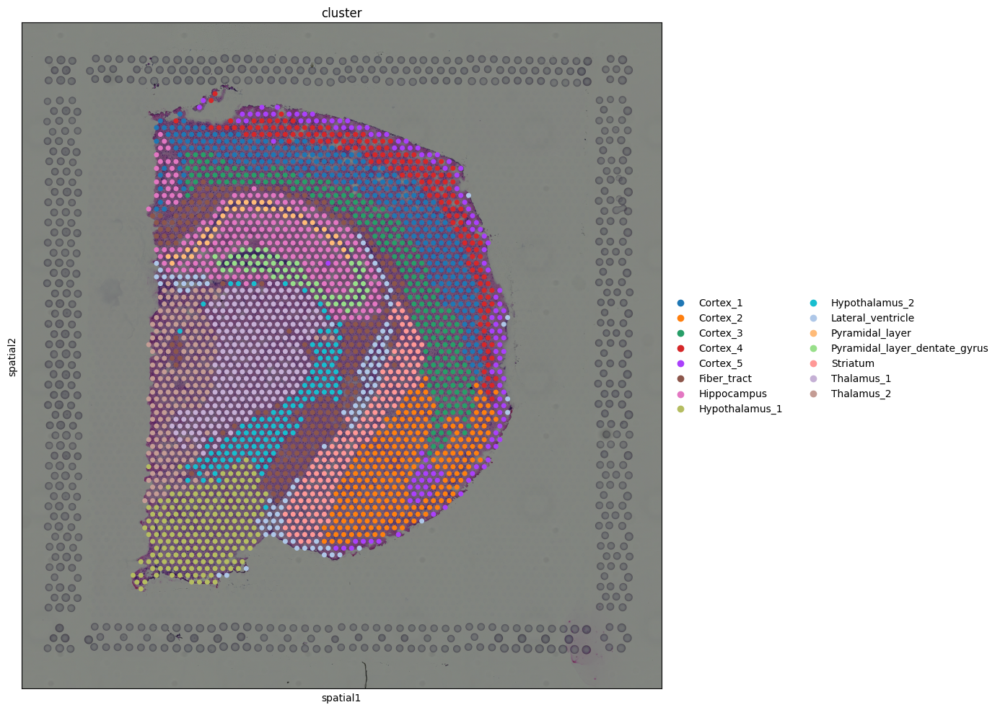

In [80]:
# import squidpy as sq
# import matplotlib.pyplot as plt

# # Load the pre-processed dataset
# img = sq.datasets.visium_hne_image()
# adata2 = sq.datasets.visium_hne_adata()

# # Create a larger figure and axis
# fig, ax = plt.subplots(figsize=(12, 12))  # Adjust the size (width, height)

# # Pass the axis to spatial_scatter
# sq.pl.spatial_scatter(adata2, color="cluster", ax=ax)

# # Display the plot
# plt.show()

# 2.1 Spot-level Quality Control

In [ ]:
# https://bookdown.org/sjcockell/ismb-tutorial-2023/

## Introduction to Spot-Level Quality Control (sQC)

Quality control (QC) is essential for analyzing high-throughput molecular biology data. Removing noise and low-quality data from complex datasets enhances the reliability of downstream analyses. Spatial transcriptomics (STx) is no exception, with QC typically performed at two main levels: **spot-level** and **gene-level**. This document focuses on **spot-level QC**.

### Spot-Level Quality Control (sQC)

Spot-level QC eliminates low-quality spots prior to analysis. These low-quality spots can result from issues during library preparation or experimental procedures, such as:
- **High percentage of dead cells** due to cell damage during library preparation.
- **Low mRNA capture efficiency** caused by ineffective reverse transcription or PCR amplification.

Keeping low-quality spots can introduce noise and compromise the accuracy of downstream analyses.

### Characteristics of Low-Quality Spots

Low-quality spots are identified using criteria similar to those used in cell-level QC for single-cell RNA sequencing (scRNA-seq) data:
- **Library size**: Total UMI counts per spot may vary due to sequencing or the number of cells in the spot.
- **Number of expressed genes**: The number of genes with non-zero UMI counts per spot.
- **Proportion of mitochondrial reads**: A high proportion indicates potential cell damage.

#### Key Indicators:
1. **Low Library Size / Expressed Features**:
   - Reflects poor mRNA capture rates due to cell damage or low reaction efficiency.
2. **High Mitochondrial Proportion**:
   - Indicates cell damage, e.g., partial lysis, leading to cytoplasmic mRNA leakage and a higher concentration of relatively protected mitochondrial mRNAs.
3. **Unusually High Cell Numbers per Spot**:
   - May indicate problems during cell segmentation.

### Relevance of scRNA-seq QC Metrics in STx

The use of scRNA-seq QC metrics in STx data is based on the similarity between datasets. When spatial information is ignored, each spot can be treated as a single cell. However, STx spots differ from scRNA-seq cells because they may contain zero, one, or multiple cells, leading to distinct distributions for high-quality spots compared to high-quality cells in scRNA-seq.

## 2.1.1 Plot tissue map

Initially, we will try to get a sense of the data by plotting High-Resolution Image with Spatial Coordinates Overlay

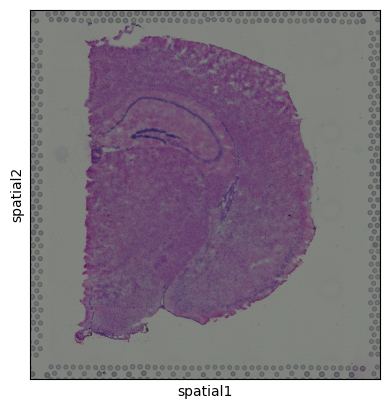

In [48]:
# Plot spatial coordinates without annotations
sc.pl.spatial(adata, color=None, size=1.5)

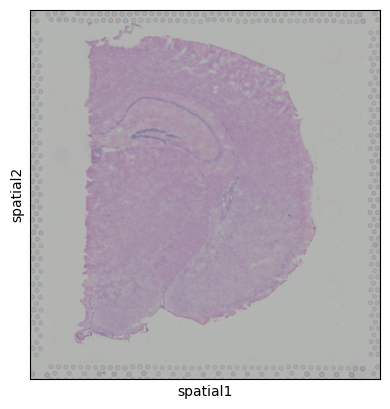

In [49]:
import scanpy as sc

# Overlay spatial coordinates on the tissue image
sc.pl.spatial(
    adata,
    color=None,       # No color (default spots)
    size=1.5,         # Adjust spot size
    img_key="hires",  # Use the high-resolution image
    alpha_img=0.6     # Adjust image transparency
)

In [62]:
scale_factor = adata.uns['spatial'][list(adata.uns['spatial'].keys())[0]]['scalefactors']['tissue_hires_scalef']
print(f"Scaling factor: {scale_factor}")

Scaling factor: 0.17011142


In [51]:
# Retrieve scaling factor for hires image
scale_factor = adata.uns['spatial'][list(adata.uns['spatial'].keys())[0]]['scalefactors']['tissue_hires_scalef']

# Determine a reasonable marker size
s = 5 / scale_factor  # Adjust the numerator based on trial

print(f"Using marker size: {s}")

Using marker size: 29.392500515250532


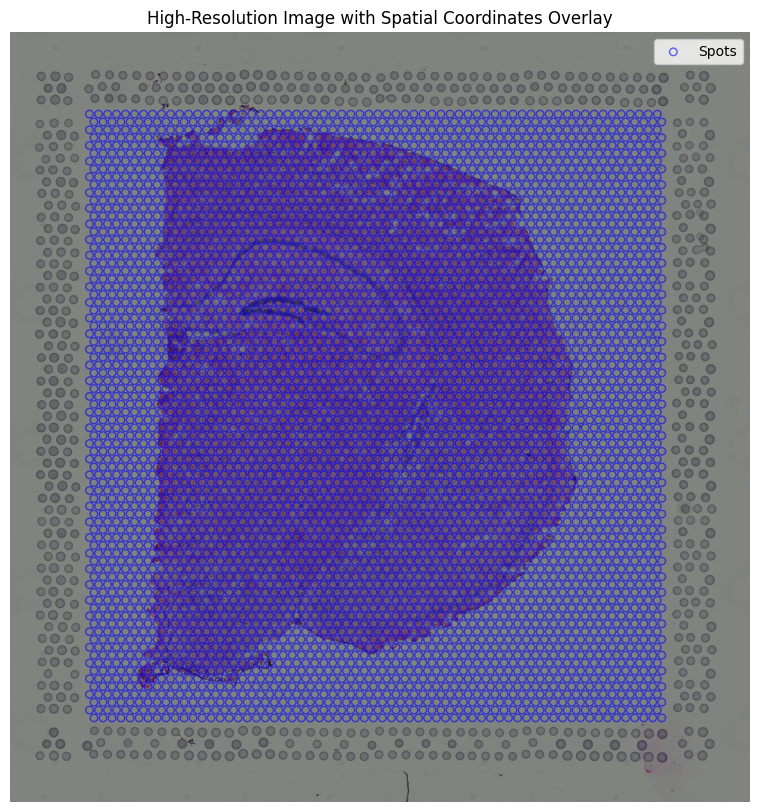

In [52]:
import matplotlib.pyplot as plt

# Extract the high-resolution image
hires_img = adata.uns['spatial'][list(adata.uns['spatial'].keys())[0]]['images']['hires']

# Extract spatial coordinates and scale
coords = adata.obsm['spatial']
scale_factor = adata.uns['spatial'][list(adata.uns['spatial'].keys())[0]]['scalefactors']['tissue_hires_scalef']
scaled_coords = coords * scale_factor

# Plot the high-resolution image
plt.figure(figsize=(10, 10))
plt.imshow(hires_img, origin='upper')

# Overlay spatial coordinates with a calculated marker size
marker_size = 29.39  # Adjust based on your calculation or scaling needs
plt.scatter(scaled_coords[:, 0], scaled_coords[:, 1], edgecolor='blue', facecolor='none', s=marker_size, alpha=0.6, label="Spots")

plt.title("High-Resolution Image with Spatial Coordinates Overlay")
plt.axis('off')
plt.legend()
plt.show()

At present, the dataset contains both on- and off-tissue spots - we plotted these in the previous practical. For any future analysis though we are only interested in the on-tissue spots. Therefore, before we run any calculations we want to remove the off-tissue spots

## 2.1.2 Calculating QC metrics

In [53]:
# Display dataset dimensions before filtering
print(f"Dataset dimensions before filtering: {adata.shape}")

# Filter to include only on-tissue spots
adata = adata[adata.obs['in_tissue'] == 1]

# Display dataset dimensions after filtering
print(f"Dataset dimensions after filtering: {adata.shape}")

Dataset dimensions before filtering: (4992, 32285)
Dataset dimensions after filtering: (2702, 32285)


Now we are spot on :) ! The next thing we need to do before we make decisions on how to quality “trim” the dataset is to calculate the percentage per spot of mitochodrial gene expression and store this information inside the colData. First of all, find the mitochrondrial genes - their gene names start with “MT-” or “mt-”.

In [54]:
# Identify mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-')

# Display mitochondrial genes
mito_genes = adata.var_names[adata.var['mt']]
print(f"Mitochondrial genes: {mito_genes.tolist()}")

Mitochondrial genes: []


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_9105/2887387495.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['mt'] = adata.var_names.str.startswith('MT-')
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [55]:
# Print the first 20 gene names in your dataset
print("First 20 gene names in the dataset:")
print(adata.var_names[:20].tolist())

# Detect mitochondrial genes using alternative prefixes
mito_genes_alt = adata.var_names.str.contains("(^MT-)|(^mt-)|(^mt\\-)", regex=True)
print(f"Number of mitochondrial genes detected: {mito_genes_alt.sum()}")

# Extract and print the names of mitochondrial genes
mito_genes_list = adata.var_names[mito_genes_alt]
print("Mitochondrial genes detected:")
print(mito_genes_list.tolist())

First 20 gene names in the dataset:
['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587', 'Gm37323', 'Mrpl15', 'Lypla1', 'Tcea1', 'Rgs20', 'Gm16041', 'Atp6v1h', 'Oprk1', 'Npbwr1', 'Rb1cc1', '4732440D04Rik', 'Alkal1', 'St18']
Number of mitochondrial genes detected: 13
Mitochondrial genes detected:
['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt-Nd3', 'mt-Nd4l', 'mt-Nd4', 'mt-Nd5', 'mt-Nd6', 'mt-Cytb']


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_9105/2354530812.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = adata.var_names.str.contains("(^MT-)|(^mt-)|(^mt\\-)", regex=True)


In [56]:
import scanpy as sc

# Adjust for mouse mitochondrial genes (prefix: "mt-")
adata.var['mt'] = adata.var_names.str.startswith("mt-")

# Recalculate mitochondrial QC metrics
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=['mt'],  # Use the updated 'mt' column
    percent_top=None,  # Skip top expressed genes for now
    inplace=True       # Add results directly to adata.obs
)

# Inspect recalculated metrics
print(adata.obs[['total_counts', 'n_genes_by_counts', 'pct_counts_mt']].head())

                    total_counts  n_genes_by_counts  pct_counts_mt
AAACAAGTATCTCCCA-1       20935.0               5230      19.278721
AAACAATCTACTAGCA-1       14789.0               3646      23.118534
AAACACCAATAACTGC-1       34646.0               6272      14.627952
AAACAGAGCGACTCCT-1       16833.0               4506      20.109310
AAACCGGGTAGGTACC-1       33684.0               5971      20.606222


Calculate QC Metrics

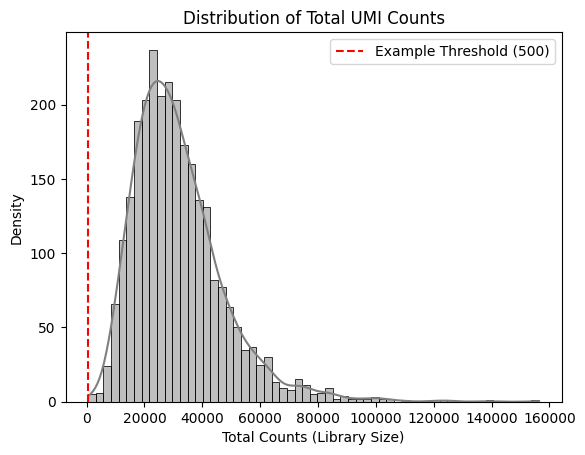

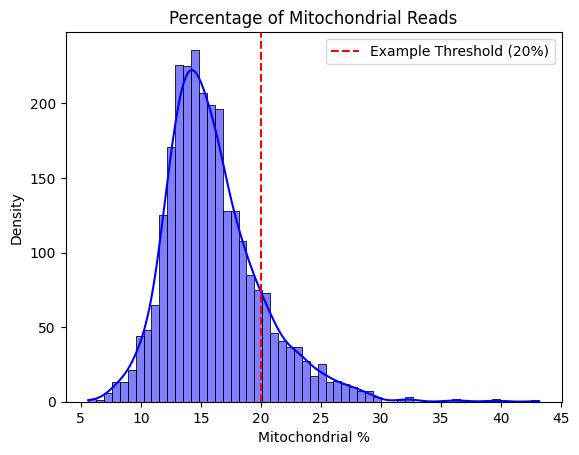

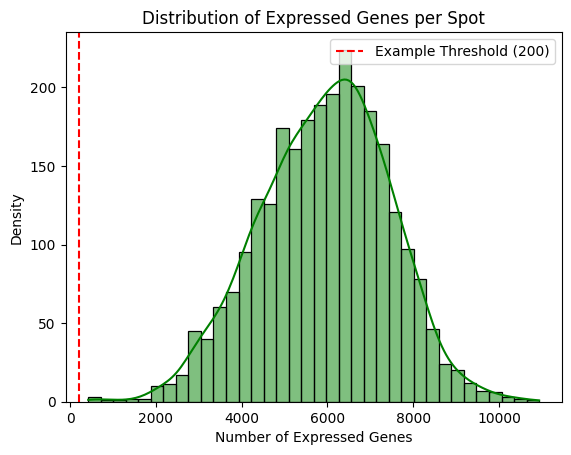

Number of low-quality spots: 390


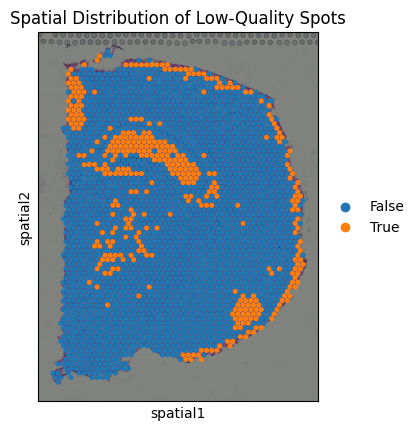

In [43]:
# # 4. Plot QC Metrics
# ## a. Total Counts (Library Size)
# sns.histplot(adata.obs['total_counts'], kde=True, color='gray')
# plt.axvline(x=500, color='red', linestyle='--', label='Example Threshold (500)')
# plt.title('Distribution of Total UMI Counts')
# plt.xlabel('Total Counts (Library Size)')
# plt.ylabel('Density')
# plt.legend()
# plt.show()

# ## b. Percentage of Mitochondrial Reads
# sns.histplot(adata.obs['pct_counts_mt'], kde=True, color='blue')
# plt.axvline(x=20, color='red', linestyle='--', label='Example Threshold (20%)')
# plt.title('Percentage of Mitochondrial Reads')
# plt.xlabel('Mitochondrial %')
# plt.ylabel('Density')
# plt.legend()
# plt.show()

# ## c. Number of Expressed Genes
# sns.histplot(adata.obs['n_genes_by_counts'], kde=True, color='green')
# plt.axvline(x=200, color='red', linestyle='--', label='Example Threshold (200)')
# plt.title('Distribution of Expressed Genes per Spot')
# plt.xlabel('Number of Expressed Genes')
# plt.ylabel('Density')
# plt.legend()
# plt.show()

# # 5. Flag Low-Quality Spots
# adata.obs['low_library_size'] = adata.obs['total_counts'] < 500
# adata.obs['high_mito_content'] = adata.obs['pct_counts_mt'] > 20
# adata.obs['low_gene_count'] = adata.obs['n_genes_by_counts'] < 200

# # Combine all low-quality filters
# adata.obs['low_quality'] = (
#     adata.obs['low_library_size'] |
#     adata.obs['high_mito_content'] |
#     adata.obs['low_gene_count']
# )

# # Check summary of low-quality spots
# low_quality_count = adata.obs['low_quality'].sum()
# print(f"Number of low-quality spots: {low_quality_count}")

# # 6. Visualize Spatial Distribution of Low-Quality Spots
# # Visualize spatial distribution of low-quality spots
# sc.pl.spatial(
#     adata,
#     color='low_quality',  # Highlight low-quality spots
#     size=1.5,             # Adjust marker size
#     title="Spatial Distribution of Low-Quality Spots"
# )

After calculating a required metric, we need to apply a cut-off threshold for the metric to decide whether or not to keep each spot. It is important to consider an individual dataset on its own merits, as it might need slightly different cut-off values to be applied. As a result we cannot rely on identifying a single value to use every time and we need to rely on plotting these metrics and making a decision on a dataset-by-dataset basis.

## 2.1.3 Library size threshold plot

We can plot a histogram of the library sizes across spots. The library size is the number of UMI counts in each spot.

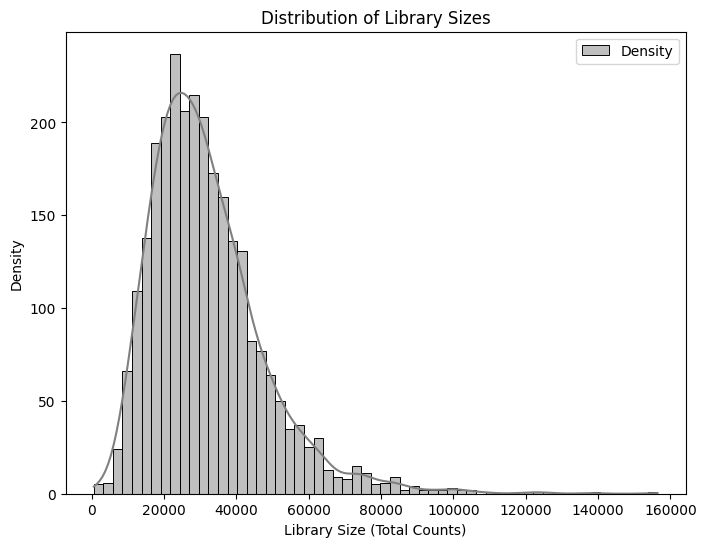

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot histogram and density of library sizes
plt.figure(figsize=(8, 6))
sns.histplot(adata.obs['total_counts'], kde=True, color='gray', label='Density')
# plt.axvline(x=700, color='red', linestyle='--', label='Threshold (700)')
plt.title('Distribution of Library Sizes')
plt.xlabel('Library Size (Total Counts)')
plt.ylabel('Density')
plt.legend()
plt.show()

As we can see there are no obvious issues with the library sizes. An example of an issue could be a high frequency of small libraries which would indicate poor experimental output. Generally we do not want to keep spots with too small libraries.

If the dataset we are analysing contains the number of cells that are present in each spot (this one does), then it makes sense to also plot the library sizes against the number of cells per spot. In that way we are making sure that we don’t remove any spots that may have biological meaning.

Scatter Plot of Library Size vs. Cell Count

<div style="border: 1px solid #ffa6a6; padding: 10px; border-radius: 5px;">
<span style="color: #ff6666; font-size: 20px;"><b>Reflection Point:</b></span> <span style="font-size: 20px;">Library size threshold plot</span>  
<ul>
    <li>What is density in the yy axis?</li>

</div>

To get a glimpse of how library size changes spatially:

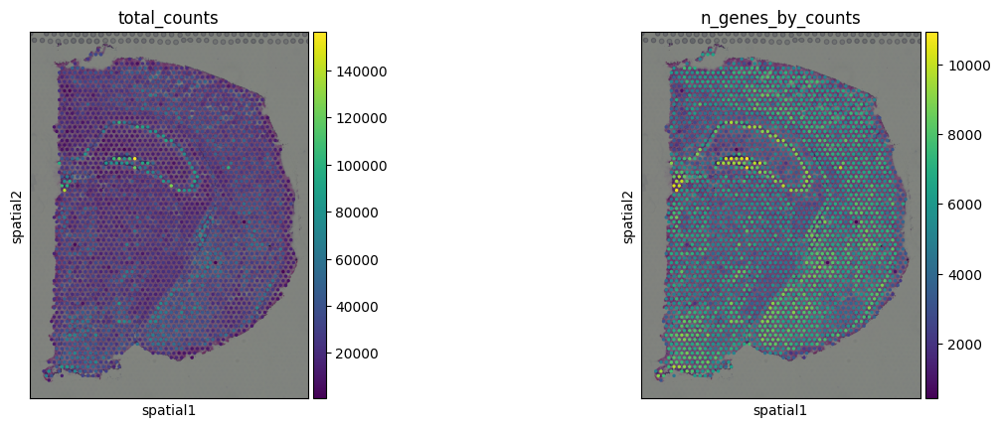

In [83]:
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

In [40]:
#ADD HIDDEN ANSWER

In [44]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Check if 'cell_count' column exists before plotting
# if 'cell_count' in adata.obs.columns:
#     plt.figure(figsize=(8, 6))
#     sns.scatterplot(x=adata.obs['cell_count'], y=adata.obs['total_counts'], s=10)
#     plt.axhline(y=700, color='red', linestyle='--', label='Threshold (700)')
#     plt.title('Library Size vs. Cell Count')
#     plt.xlabel('Cell Count')
#     plt.ylabel('Library Size (Total Counts)')
#     plt.legend()
#     plt.show()
# else:
#     print("The 'cell_count' column does not exist in adata.obs. Skipping the scatter plot.")

The 'cell_count' column does not exist in adata.obs. Skipping the scatter plot.


In [69]:
# Apply a threshold for low library size (e.g., 700 UMI counts)
adata.obs['qc_lib_size'] = adata.obs['total_counts'] < 10000

# Count the number of spots flagged as low library size
low_library_count = adata.obs['qc_lib_size'].sum()
print(f"Number of spots with low library size: {low_library_count}")

Number of spots with low library size: 68


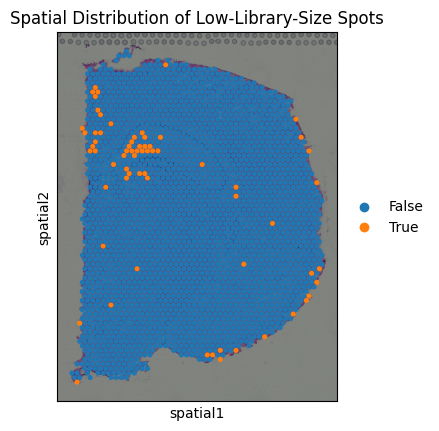

In [70]:
import scanpy as sc

# Visualize spots flagged for low library size
sc.pl.spatial(
    adata,
    color='qc_lib_size',
    size=1.5,
    title="Spatial Distribution of Low-Library-Size Spots"
)

Number of spots flagged with stricter threshold (2000): 615


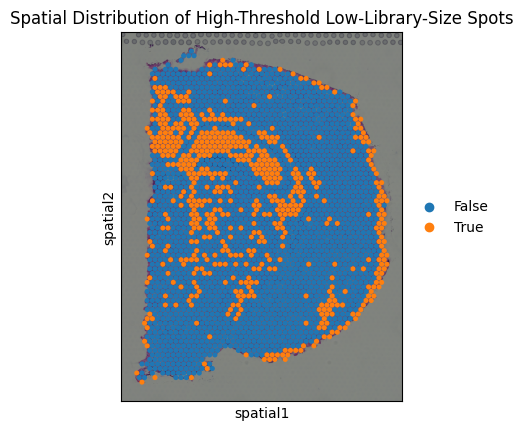

In [71]:
# Apply a stricter threshold for library size
adata.obs['qc_lib_size_high'] = adata.obs['total_counts'] < 20000

# Count the number of spots flagged with the stricter threshold
high_threshold_count = adata.obs['qc_lib_size_high'].sum()
print(f"Number of spots flagged with stricter threshold (2000): {high_threshold_count}")

# Visualize spots flagged with stricter threshold
sc.pl.spatial(
    adata,
    color='qc_lib_size_high',
    size=1.5,
    title="Spatial Distribution of High-Threshold Low-Library-Size Spots"
)

We need to keep in mind here that the threshold is, to an extent, arbitrary. It is therefore important to look at the number of spots that are left out of the dataset by this choice of cut-off value, and also have a look at their putative spatial patterns. If we filtered out spots with biological relevance, then we should observe some patterns on the tissue map that correlate with some of the known biological structures of the tissue. If we do observe such a phenomenon, we have probably set our threshold too high (i.e. not permissive enough).

<div style="border: 1px solid #ffa6a6; padding: 10px; border-radius: 5px;">
<span style="color: #ff6666; font-size: 20px;"><b>Reflection Point:</b></span> <span style="font-size: 20px;">Library size threshold plot</span>  
<ul>
    <li>Do you see any spatial patterning while we are thresholding?</li>

</div>

Number of spots flagged with stricter threshold (2000): 16


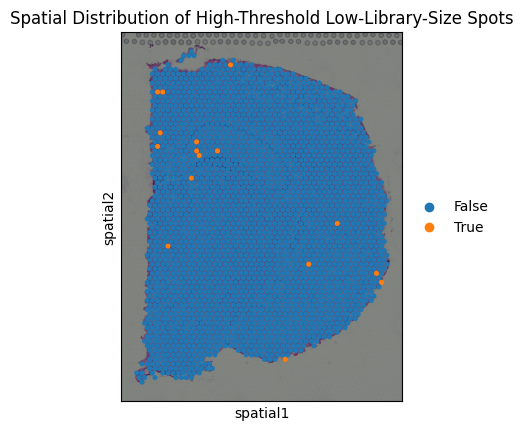

In [97]:
# Apply a stricter threshold for library size
adata.obs['qc_lib_size_high'] = adata.obs['total_counts'] < 7000

# Count the number of spots flagged with the stricter threshold
high_threshold_count = adata.obs['qc_lib_size_high'].sum()
print(f"Number of spots flagged with stricter threshold (2000): {high_threshold_count}")

# Visualize spots flagged with stricter threshold
sc.pl.spatial(
    adata,
    color='qc_lib_size_high',
    size=1.5,
    title="Spatial Distribution of High-Threshold Low-Library-Size Spots"
)

## 2.1.4 Number of expressed genes

As we did with the library sizes, we can plot a histogram of the number of expressed genes across spots. A gene is “expressed” in a spot if it has at least one count in it.

/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_9105/1510646086.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


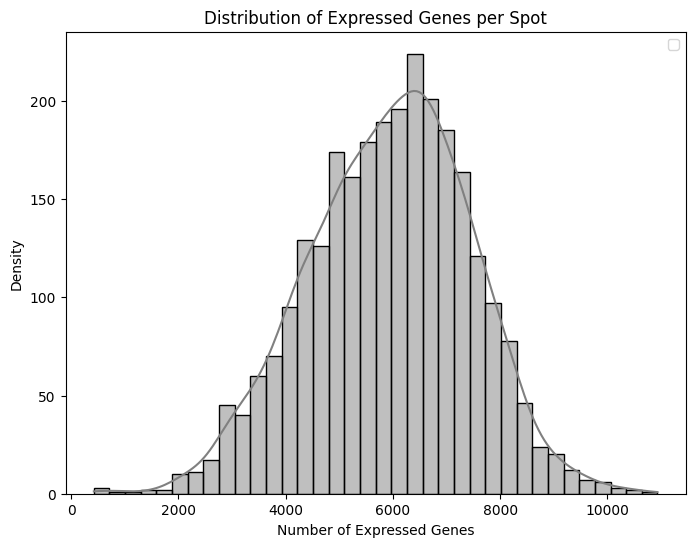

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of expressed genes
plt.figure(figsize=(8, 6))
sns.histplot(adata.obs['n_genes_by_counts'], kde=True, color='gray')
plt.title('Distribution of Expressed Genes per Spot')
plt.xlabel('Number of Expressed Genes')
plt.ylabel('Density')
# plt.axvline(x=2000, color='red', linestyle='--', label='Threshold (500)')
plt.legend()
plt.show()

In [59]:
# Ensure 'cell_count' exists; otherwise, skip the scatter plot
if 'cell_count' in adata.obs.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        x=adata.obs['cell_count'],
        y=adata.obs['n_genes_by_counts'],
        s=10
    )
    plt.axhline(y=3000, color='red', linestyle='--', label='Threshold (500)')
    plt.title('Number of Expressed Genes vs. Cell Count')
    plt.xlabel('Cell Count')
    plt.ylabel('Number of Expressed Genes')
    plt.legend()
    plt.show()
else:
    print("The 'cell_count' column does not exist in adata.obs. Skipping scatter plot.")

The 'cell_count' column does not exist in adata.obs. Skipping scatter plot.


Finally, again as before, we apply the chosen threshold to flag spots with (in this case) fewer than 500 expressed genes.

In [95]:
# Apply the threshold for the number of expressed genes
threshold_expressed_genes = 2000
adata.obs['qc_expressed_genes'] = adata.obs['n_genes_by_counts'] < threshold_expressed_genes

# Count the number of spots flagged as low-quality based on expressed genes
low_quality_genes_count = adata.obs['qc_expressed_genes'].sum()
print(f"Number of spots with fewer than {threshold_expressed_genes} expressed genes: {low_quality_genes_count}")

Number of spots with fewer than 2000 expressed genes: 10


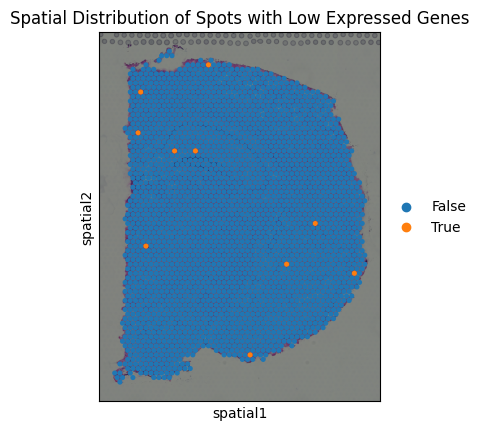

In [96]:
# Visualize spots flagged for low expressed genes
sc.pl.spatial(
    adata,
    color='qc_expressed_genes',
    size=1.5,
    title='Spatial Distribution of Spots with Low Expressed Genes'
)

Optional: Adjust Threshold to Test Over-Enthusiastic Filtering

Number of spots flagged with stricter threshold (4000): 292


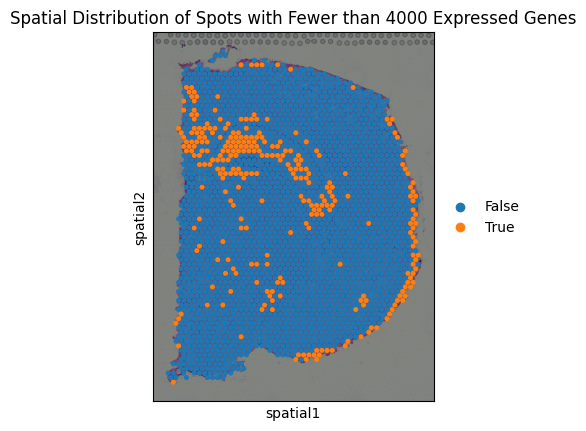

In [98]:
# Apply a stricter threshold for expressed genes
strict_threshold_expressed_genes = 4000
adata.obs['qc_expressed_genes_strict'] = adata.obs['n_genes_by_counts'] < strict_threshold_expressed_genes

# Count the number of spots flagged with the stricter threshold
strict_flagged_count = adata.obs['qc_expressed_genes_strict'].sum()
print(f"Number of spots flagged with stricter threshold ({strict_threshold_expressed_genes}): {strict_flagged_count}")

# Visualize spatial distribution of strictly flagged spots
sc.pl.spatial(
    adata,
    color='qc_expressed_genes_strict',
    size=1.5,
    title=f'Spatial Distribution of Spots with Fewer than {strict_threshold_expressed_genes} Expressed Genes'
)

## 2.1.5 Percentage of mitochondrial expression

As we briefly touched on at the beginning, a high proportion of mitochondrial reads indicates low cell quality, probably due to cell damage.

We calculated this data earlier on in this session, and can now investigate the percentage of mitochondrial expression across spots

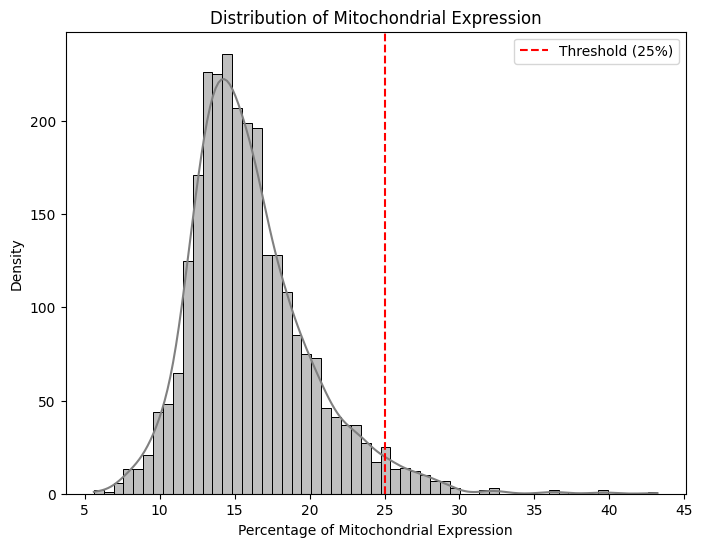

In [99]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of mitochondrial expression
if 'pct_counts_mt' in adata.obs.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(adata.obs['pct_counts_mt'], kde=True, color='gray')
    plt.title('Distribution of Mitochondrial Expression')
    plt.xlabel('Percentage of Mitochondrial Expression')
    plt.ylabel('Density')
    plt.axvline(x=25, color='red', linestyle='--', label='Threshold (25%)')
    plt.legend()
    plt.show()
else:
    print("The 'pct_counts_mt' column does not exist in adata.obs. Skipping the histogram plot.")

In [100]:
# # Scatter plot: Percentage of mitochondrial expression vs. Number of cells per spot
# if 'pct_counts_mt' in adata.obs.columns and 'cell_count' in adata.obs.columns:
#     plt.figure(figsize=(8, 6))
#     sns.scatterplot(
#         x=adata.obs['cell_count'],
#         y=adata.obs['pct_counts_mt'],
#         s=10
#     )
#     plt.axhline(y=28, color='red', linestyle='--', label='Threshold (28%)')
#     plt.title('Percentage of Mitochondrial Expression vs. Cell Count')
#     plt.xlabel('Number of Cells per Spot')
#     plt.ylabel('Percentage of Mitochondrial Expression')
#     plt.legend()
#     plt.show()
# else:
#     print("Required columns 'pct_counts_mt' or 'cell_count' do not exist in adata.obs. Skipping scatter plot.")

Required columns 'pct_counts_mt' or 'cell_count' do not exist in adata.obs. Skipping scatter plot.


In this instance, a higher percentage of mitochondrial expression is the thing to avoid, so the threshold is an upper bound, rather than the lower bounds we have observed so far. Our suggestion this time is to cut-off at 28%.

In [101]:
# Apply the threshold for mitochondrial expression
threshold_mito_percent = 25
if 'pct_counts_mt' in adata.obs.columns:
    adata.obs['qc_mito'] = adata.obs['pct_counts_mt'] > threshold_mito_percent

    # Count the number of flagged spots
    flagged_mito_count = adata.obs['qc_mito'].sum()
    print(f"Number of spots with mitochondrial expression above {threshold_mito_percent}%: {flagged_mito_count}")
else:
    print("The 'pct_counts_mt' column does not exist in adata.obs. Skipping thresholding.")

Number of spots with mitochondrial expression above 25%: 91


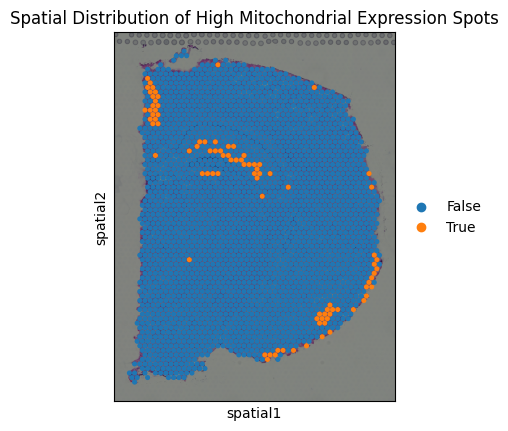

In [102]:
# Visualize spatial distribution of flagged spots based on mitochondrial expression
if 'qc_mito' in adata.obs.columns:
    import scanpy as sc
    sc.pl.spatial(
        adata,
        color='qc_mito',
        size=1.5,
        title='Spatial Distribution of High Mitochondrial Expression Spots'
    )
else:
    print("The 'qc_mito' column does not exist in adata.obs. Skipping spatial visualization.")

Again, try to illustrate what happens if we set the threshold too low (i.e., 20 0r 25%).

## 2.1.6 Number of cells per spot

In [103]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Plot the distribution of the number of cells per spot
# if 'cell_count' in adata.obs.columns:
#     plt.figure(figsize=(8, 6))
#     sns.histplot(adata.obs['cell_count'], binwidth=1, kde=True, color='gray')
#     plt.title('Distribution of Number of Cells per Spot')
#     plt.xlabel('Number of Cells per Spot')
#     plt.ylabel('Density')
#     plt.axvline(x=10, color='red', linestyle='--', label='Threshold (10 cells)')
#     plt.legend()
#     plt.show()
# else:
#     print("The 'cell_count' column does not exist in adata.obs. Skipping the histogram plot.")

The 'cell_count' column does not exist in adata.obs. Skipping the histogram plot.


In [104]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Plot the distribution of the number of cells per spot with expanded x-axis range
# if 'cell_count' in adata.obs.columns:
#     plt.figure(figsize=(10, 6))  # Increase figure size for better visualization
#     sns.histplot(adata.obs['cell_count'], binwidth=1, kde=True, color='gray')
#     plt.title('Distribution of Number of Cells per Spot')
#     plt.xlabel('Number of Cells per Spot')
#     plt.ylabel('Density')
#     plt.axvline(x=10, color='red', linestyle='--', label='Threshold (10 cells)')
#     plt.xlim(0, 30)  # Set x-axis range from 0 to 30
#     plt.legend()
#     plt.show()
# else:
#     print("The 'cell_count' column does not exist in adata.obs. Skipping the histogram plot.")


The 'cell_count' column does not exist in adata.obs. Skipping the histogram plot.


In [105]:
# # Scatter plot: Number of expressed genes vs. Number of cells per spot
# if 'cell_count' in adata.obs.columns:
#     plt.figure(figsize=(8, 6))
#     sns.regplot(
#         x=adata.obs['cell_count'], 
#         y=adata.obs['n_genes_by_counts'], 
#         scatter_kws={'s': 10}, 
#         line_kws={'color': 'red'}, 
#         ci=None
#     )
#     plt.axvline(x=10, color='blue', linestyle='--', label='Threshold (10 cells)')
#     plt.title('Number of Expressed Genes vs. Number of Cells per Spot')
#     plt.xlabel('Number of Cells per Spot')
#     plt.ylabel('Number of Expressed Genes')
#     plt.legend()
#     plt.show()
# else:
#     print("The 'cell_count' column does not exist in adata.obs. Skipping the scatter plot.")

The 'cell_count' column does not exist in adata.obs. Skipping the scatter plot.


In [106]:
# # Scatter plot: Number of expressed genes vs. Number of cells per spot
# if 'cell_count' in adata.obs.columns and 'n_genes_by_counts' in adata.obs.columns:
#     plt.figure(figsize=(8, 6))
#     sns.scatterplot(
#         x=adata.obs['cell_count'],
#         y=adata.obs['n_genes_by_counts'],
#         s=20
#     )
#     sns.regplot(
#         x=adata.obs['cell_count'],
#         y=adata.obs['n_genes_by_counts'],
#         scatter=False,
#         ci=None,
#         color="blue",
#         line_kws={'linestyle': '--'}
#     )
#     plt.axvline(x=10, color='red', linestyle='--', label='Threshold (10 cells)')
#     plt.title('Number of Expressed Genes vs. Number of Cells per Spot')
#     plt.xlabel('Number of Cells per Spot')
#     plt.ylabel('Number of Expressed Genes')
#     plt.legend()
#     plt.show()
# else:
#     print("Required columns ('cell_count' and 'n_genes_by_counts') not available. Skipping scatter plot.")

Required columns ('cell_count' and 'n_genes_by_counts') not available. Skipping scatter plot.


In [107]:
# # Flagging spots with a high number of cells
# if 'cell_count' in adata.obs.columns:
#     cell_count_threshold = 10
#     adata.obs['qc_cell_count'] = adata.obs['cell_count'] > cell_count_threshold
#     flagged_high_cell_count = adata.obs['qc_cell_count'].sum()
#     print(f"Number of spots with more than {cell_count_threshold} cells: {flagged_high_cell_count}")

In [108]:
# import scanpy as sc

# # Visualizing spatial distribution of flagged spots
# if 'qc_cell_count' in adata.obs.columns:
#     sc.pl.spatial(
#         adata,
#         color='qc_cell_count',
#         size=1.5,
#         title='Spatial Distribution of Spots with High Cell Count'
#     )
# else:
#     print("'qc_cell_count' column does not exist. Skipping spatial plot.")


'qc_cell_count' column does not exist. Skipping spatial plot.


## 2.1.7 Remove low-quality spots

Number of discarded spots for each metric:
{'qc_lib_size': 68, 'qc_expressed_genes': 10, 'qc_mito': 91}
Total spots marked as discarded: 139


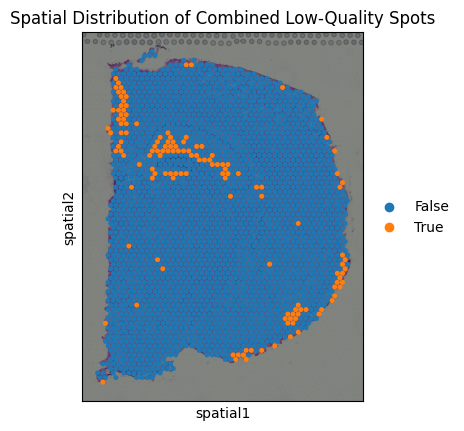

No 'ground_truth' column found in adata.obs. Skipping NA spot filtering.
Remaining spots after filtering: 2563


In [112]:
# Step 1: Check the number of discarded spots for each metric
# Verify required columns exist
metrics_to_check = ['qc_lib_size', 'qc_expressed_genes', 'qc_mito']
discarded_counts = {}
for metric in metrics_to_check:
    if metric in adata.obs.columns:
        discarded_counts[metric] = adata.obs[metric].sum()
    else:
        print(f"Warning: '{metric}' column not found in adata.obs.")

print("Number of discarded spots for each metric:")
print(discarded_counts)

# Step 2: Combine the set of discarded spots
if all(metric in adata.obs.columns for metric in metrics_to_check):
    adata.obs['discard'] = (
        adata.obs['qc_lib_size'] |
        adata.obs['qc_expressed_genes'] |
        adata.obs['qc_mito']
    )
    print(f"Total spots marked as discarded: {adata.obs['discard'].sum()}")
else:
    print("Error: One or more required QC metrics are missing. Cannot combine discarded spots.")

# Step 3: Visualize the spatial pattern of combined discarded spots
if 'discard' in adata.obs.columns:
    import scanpy as sc
    sc.pl.spatial(
        adata,
        color='discard',
        size=1.5,
        title='Spatial Distribution of Combined Low-Quality Spots'
    )
else:
    print("Error: 'discard' column not found in adata.obs. Cannot visualize.")

# Step 4: Further remove spots with missing annotations (optional)
if 'ground_truth' in adata.obs.columns:
    # Create a QC column for spots without annotations
    adata.obs['qc_NA_spots'] = adata.obs['ground_truth'].isna()
    # Update the combined discard column
    adata.obs['discard'] = (
        adata.obs['discard'] |
        adata.obs['qc_NA_spots']
    )
    print(f"Number of spots without annotation: {adata.obs['qc_NA_spots'].sum()}")
    print(f"Total spots marked as discarded (after including NA spots): {adata.obs['discard'].sum()}")

    # Visualize the updated spatial pattern
    sc.pl.spatial(
        adata,
        color='discard',
        size=1.5,
        title='Spatial Distribution of Discarded Spots (Including NA Annotations)'
    )
else:
    print("No 'ground_truth' column found in adata.obs. Skipping NA spot filtering.")

# Step 5: Remove the combined set of low-quality spots
if 'discard' in adata.obs.columns:
    adata = adata[~adata.obs['discard'], :]
    print(f"Remaining spots after filtering: {adata.shape[0]}")
else:
    print("Error: 'discard' column not found in adata.obs. Cannot filter spots.")

In [113]:
adata

View of AnnData object with n_obs × n_vars = 2563 × 32285
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'qc_expressed_genes', 'qc_lib_size', 'qc_lib_size_high', 'qc_expressed_genes_strict', 'qc_mito', 'discard'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial', 'qc_expressed_genes_colors', 'qc_lib_size_colors', 'qc_lib_size_high_colors', 'qc_expressed_genes_strict_colors', 'qc_mito_colors', 'discard_colors'
    obsm: 'spatial'

# 2.2: Normalisation of counts

Normalization in Spatial Transcriptomics (STx) is crucial for mitigating systematic effects in count data, such as variations in library size (counts/UMIs per spot), which are not biologically relevant.

Library Size Scaling:

Normalization adjusts library sizes across all spots so that their mean becomes 1.
Counts are scaled using library size factors, enabling more accurate comparisons of expression levels.
Log-Transformation:

Applied to stabilize variance, preventing dominance by highly expressed genes.
Facilitates comparisons by rendering expression changes symmetrical.
A pseudocount of 1 is added to avoid undefined values for log2(0).
Tools and Justification:

Methods from scater and scran are employed to calculate normalized logcounts using library size factors.
Unlike scRNA-seq, alternative normalization approaches are less applicable in STx due to:
Spots potentially containing multiple cell types.
Datasets spanning multiple tissue samples, causing clustering variability.
Normalization is foundational for reliable downstream analysis in STx data.

In [114]:
# Normalize total counts per spot such that the mean library size is 1
sc.pp.normalize_total(adata, target_sum=1e6)  # Optional: Scale to 1e6 for interpretability
adata.obs['size_factors'] = adata.obs['total_counts'] / adata.obs['total_counts'].mean()

# Display summary statistics of the size factors
size_factors_summary = adata.obs['size_factors'].describe()
print("Summary Statistics of Library Size Factors:")
print(size_factors_summary)

Summary Statistics of Library Size Factors:
count    2563.000000
mean        1.000000
std         0.472535
min         0.305382
25%         0.673573
50%         0.908386
75%         1.217786
max         4.760868
Name: size_factors, dtype: float64


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


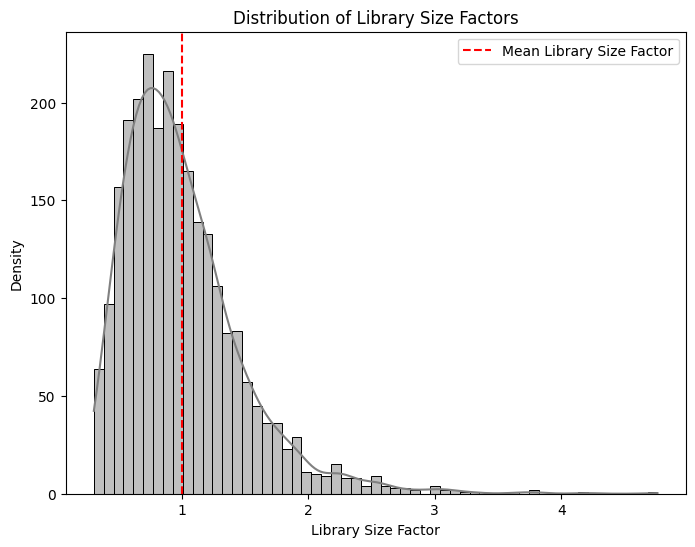

In [115]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of library size factors
plt.figure(figsize=(8, 6))
sns.histplot(adata.obs['size_factors'], kde=True, color='gray')
plt.title('Distribution of Library Size Factors')
plt.xlabel('Library Size Factor')
plt.ylabel('Density')
plt.axvline(x=adata.obs['size_factors'].mean(), color='red', linestyle='--', label='Mean Library Size Factor')
plt.legend()
plt.show()

The log-transformation that takes place is a log2-transformation and in order to avoid - Infinity values we add a pseudo value of 1. Both the log2- transformation and the pseudocount of 1 are defaults in this method.

In [116]:
# Log-transform counts with a pseudocount of 1
sc.pp.log1p(adata)  # Log-transform the normalized counts and store them in adata.X

# 2.3 Selecting genes

### 2.3.1 Background

Gene selection - or alternatively “feature selection” - is applied to identify genes that are likely to be informative for downstream analyses. The most common feature selection method is the definition of highly variable genes (HVGs). The assumption is that since we quality-controlled and normalised our dataset, the genes with high variability are the ones that contain high levels of biological variability too. Since here we have a spatial dataset we can also try to identify spatially variable genes too (SVGs).

It is important to note that HVGs are identified solely from the gene expression data. Spatial information does not play a role in finding HVGs. STx data pose a dilemma; does the meaningful spatial information reflect only spatial distribution of major cell types or does it reflect additional important spatial features? If we believe the former, relying on HVGs can be enough. If the second also holds true though, it is important to identify SVGs as well.

### 2.3.2 Highly Variable Genes (HVGs)

In [122]:
# Step 1: Remove mitochondrial genes
if 'mt' in adata.var.columns:
    # Filter out mitochondrial genes
    non_mito_genes = ~adata.var['mt']
    adata_filtered = adata[:, non_mito_genes].copy()
    print(f"Removed mitochondrial genes. Remaining genes: {adata_filtered.shape[1]}")
else:
    # If no mitochondrial annotation, proceed with all genes
    print("Mitochondrial gene annotation ('mt') not found. Proceeding with all genes.")
    adata_filtered = adata.copy()

Removed mitochondrial genes. Remaining genes: 32272


In [124]:
# Filter out genes with near-zero mean expression
gene_filter = adata_filtered.X.mean(axis=0).A1 > 1e-12  # Adjust threshold as needed
adata_filtered = adata_filtered[:, gene_filter]

# Identify highly variable genes
sc.pp.highly_variable_genes(
    adata_filtered,
    flavor='cell_ranger',  # Alternative flavor to avoid Seurat_v3
    n_top_genes=int(0.1 * adata_filtered.shape[1]),  # Top 10% HVGs
    subset=False
)

# Display the number of HVGs
hvg_count = adata_filtered.var['highly_variable'].sum()
print(f"Number of Highly Variable Genes: {hvg_count}")


Number of Highly Variable Genes: 2190


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:696: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


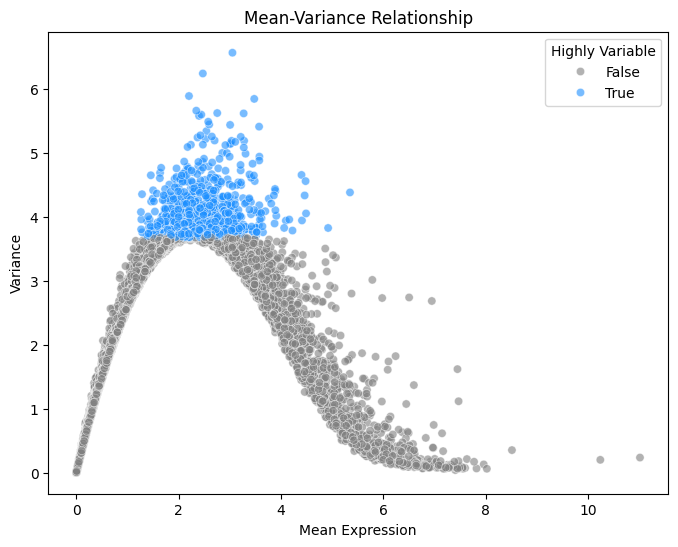

In [128]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate mean and variance for each gene
adata_filtered.var['mean'] = np.array(adata_filtered.X.mean(axis=0)).flatten()
adata_filtered.var['variance'] = np.array(
    (adata_filtered.X.multiply(adata_filtered.X)).mean(axis=0) - np.square(adata_filtered.X.mean(axis=0))
).flatten()

# Select top 10% of genes based on variance
top_10_percent = adata_filtered.var['variance'].quantile(0.9)
adata_filtered.var['highly_variable'] = adata_filtered.var['variance'] > top_10_percent

# Plot mean-variance relationship
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=adata_filtered.var['mean'],
    y=adata_filtered.var['variance'],
    hue=adata_filtered.var['highly_variable'],
    palette={True: 'dodgerblue', False: 'gray'},
    alpha=0.6
)
plt.title('Mean-Variance Relationship')
plt.xlabel('Mean Expression')
plt.ylabel('Variance')
plt.legend(title='Highly Variable')
plt.show()

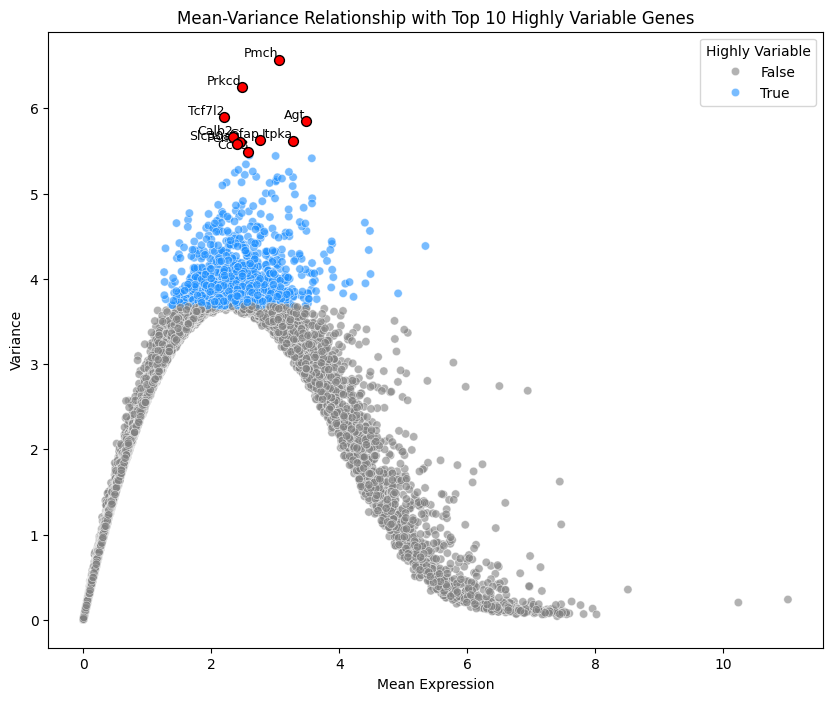

In [129]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate mean and variance for each gene
adata_filtered.var['mean'] = np.array(adata_filtered.X.mean(axis=0)).flatten()
adata_filtered.var['variance'] = np.array(
    (adata_filtered.X.multiply(adata_filtered.X)).mean(axis=0) - np.square(adata_filtered.X.mean(axis=0))
).flatten()

# Select top 10% of genes based on variance
top_10_percent = adata_filtered.var['variance'].quantile(0.9)
adata_filtered.var['highly_variable'] = adata_filtered.var['variance'] > top_10_percent

# Identify the top 10 highly variable genes
top_10_genes = adata_filtered.var.sort_values('variance', ascending=False).head(10)

# Plot mean-variance relationship
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=adata_filtered.var['mean'],
    y=adata_filtered.var['variance'],
    hue=adata_filtered.var['highly_variable'],
    palette={True: 'dodgerblue', False: 'gray'},
    alpha=0.6
)

# Highlight and annotate top 10 highly variable genes
for gene_name, (mean, variance) in top_10_genes[['mean', 'variance']].iterrows():
    plt.scatter(mean, variance, color='red', edgecolor='black', s=50, zorder=5)  # Highlight points
    plt.text(mean, variance, gene_name, fontsize=9, color='black', ha='right', va='bottom')  # Add text annotations

plt.title('Mean-Variance Relationship with Top 10 Highly Variable Genes')
plt.xlabel('Mean Expression')
plt.ylabel('Variance')
plt.legend(title='Highly Variable', loc='upper right')
plt.show()


# 2.4 Dimensionality reduction, clustering and visualisation

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


PCA component names: ['spatial', 'X_pca']
PCA dimensions: (2563, 50)


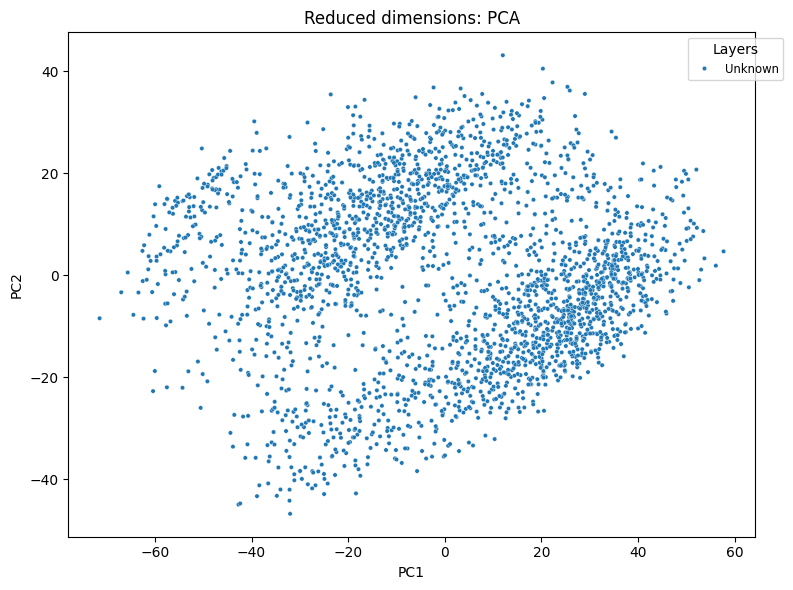

In [134]:
np.random.seed(987)

# Perform PCA on the highly variable genes
sc.tl.pca(adata_filtered, n_comps=50, svd_solver='arpack', use_highly_variable=True)

# Check correctness - print PCA component names and dimensions
print("PCA component names:", adata_filtered.obsm_keys())
print("PCA dimensions:", adata_filtered.obsm['X_pca'].shape)

# Visualize the top 2 PCA dimensions
pca_df = pd.DataFrame(
    adata_filtered.obsm['X_pca'][:, :2],
    columns=['PC1', 'PC2']
)
pca_df['ground_truth'] = adata_filtered.obs['ground_truth'] if 'ground_truth' in adata_filtered.obs.columns else 'Unknown'

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=pca_df,
    x='PC1', y='PC2', hue='ground_truth', palette='tab10', s=10
)
plt.title("Reduced dimensions: PCA")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Layers", loc='best', fontsize='small', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

In [140]:
# # Perform UMAP on the top 50 PCs
# sc.pp.neighbors(adata_filtered, use_rep='X_pca', n_neighbors=15, random_state=987)
# sc.tl.leiden(
#     adata_filtered, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
# )
# sc.tl.umap(adata_filtered, random_state=987)

# # Check correctness - print UMAP component names and dimensions
# print("UMAP component names:", adata_filtered.obsm_keys())
# print("UMAP dimensions:", adata_filtered.obsm['X_umap'].shape)

UMAP component names: ['spatial', 'X_pca', 'X_umap']
UMAP dimensions: (2563, 2)


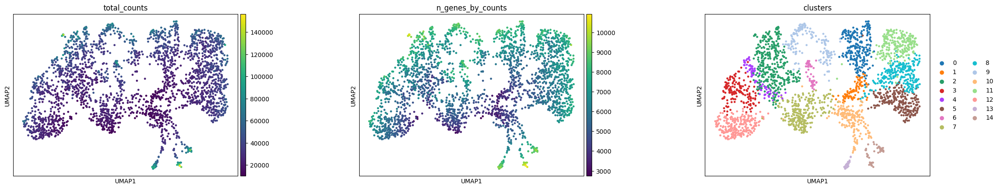

In [144]:
# sc.pl.umap(adata_filtered, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

We perform some basic filtering of spots based on total counts and expressed genes

In [ ]:
adata

<div style="border: 1px solid #ffa6a6; padding: 10px; border-radius: 5px;">
<span style="color: #ff6666; font-size: 20px;"><b>Reflection Point:</b></span> <span style="font-size: 20px;">Spatial QC Visualization</span>  
<ul>
    <li>Plot the spatial distribution of total counts, number of genes, and mitochondrial percentage.</li>
</ul>
<p>Reflect on the following:</p>
<ol>
    <li>Are there regions with consistently high or low QC metrics?</li>
    <li>How might this influence your filtering decisions?</li>
    <li>If you want to analyze mitochondrial and bioenergetics activity in spatial data, how would you compensate for mitochondrial filtering?</li>
</ol>
</div>

In [ ]:
from IPython.display import display, HTML

# Define the reflection question with green styling
reflection_question = """
<div style="border: 1px solid #90ee90; padding: 10px; border-radius: 5px;">
<span style="color: #32cd32; font-size: 16px;"><b>Some thoughts on mitochondria and bioenergetic analyses:</b></span>
</div>
"""

# Define the hidden answer with collapsible content
hidden_answer = """
<details>
<summary>Click to reveal the answer</summary>
<p>
To analyze mitochondrial and bioenergetic activity, you can compensate for mitochondrial filtering by:
<ul>
    <li><b>Adjusting Thresholds:</b> Use higher thresholds for mitochondrial gene percentage (e.g., 30%) or avoid filtering by mitochondrial content entirely.</li>
    <li><b>Focusing on Mitochondrial Genes:</b> Analyze mitochondrial genes separately to study bioenergetic activity while applying QC on non-mitochondrial genes.</li>
    <li><b>Localized Filtering:</b> Retain regions with high mitochondrial content where bioenergetic activity is biologically relevant, and filter based on other QC metrics (e.g., total counts).</li>
    <li><b>Spatial Context:</b> Use spatial neighborhood analyses (e.g., with Squidpy) to understand how regions with high mitochondrial activity interact with surrounding spots.</li>
</ul>
Visualizing mitochondrial content spatially helps identify patterns, such as biologically active regions, cell stress zones, or edge artifacts, ensuring meaningful analysis.
</p>
</details>
"""

# Display the reflection question with hidden answer
display(HTML(reflection_question + hidden_answer))

In [ ]:
from IPython.display import display, HTML

# Define the reflection question with green styling
reflection_question = """
<div style="border: 1px solid #90ee90; padding: 10px; border-radius: 5px;">
<span style="color: #32cd32; font-size: 16px;"><b>Thoughts on cell cycle:</b></span>
</div>
"""

# Define the hidden answer with collapsible content
hidden_answer = """
<details>
<summary>Click to reveal the answer</summary>
<p>
Understanding cell cycle dynamics in spatial transcriptomics is crucial because:
<ul>
    <li>It highlights regions of proliferation (e.g., neural progenitor zones in the brain).</li>
    <li>It can reveal tissue-specific processes such as gliogenesis or tumor growth.</li>
    <li>Cell cycle activity might dominate variability in datasets, overshadowing other biological processes.</li>
</ul>

However, regressing out cell cycle effects has trade-offs:
<ul>
    <li><b>When to regress:</b> If your focus is on non-proliferative processes (e.g., immune signaling or tissue organization), removing cell cycle effects can reduce noise.</li>
    <li><b>When not to regress:</b> If your goal is to study cell cycle-related phenomena (e.g., neural progenitor activity, tumor dynamics), regressing out cell cycle effects may remove biologically meaningful signals.</li>
</ul>

Ultimately, the decision depends on the biological question and the specific regions of interest in your analysis.
</p>
</details>
"""

# Display the reflection question with hidden answer
display(HTML(reflection_question + hidden_answer))

In [ ]:
from IPython.display import display, HTML

# Define the reflection question with green styling
reflection_question = """
<div style="border: 1px solid #90ee90; padding: 10px; border-radius: 5px;">
<span style="color: #32cd32; font-size: 16px;"><b>Quick recap on image features</b></span>
</div>
"""

# Define the hidden answer with collapsible content
hidden_answer = """
<details>
<summary>Click to reveal the answer</summary>
<p>
Integrating image features with gene expression data in spatial transcriptomics is important because:
<ul>
    <li><b>Complementary Information:</b> Image features provide morphological context that can complement gene expression data. For example, differences in tissue structure may align with gene expression differences.</li>
    <li><b>Biological Insights:</b> By analyzing both data types, we can uncover relationships between tissue morphology and cellular function, such as identifying specific cell types or spatial gradients.</li>
    <li><b>Multi-scale Features:</b> Features calculated at different crop sizes and scales can reveal hierarchical patterns, such as cell-level versus tissue-level organization.</li>
    <li><b>Technical Benefits:</b> Combining data types may help mitigate noise in one modality by validating it with insights from the other.</li>
</ul>
By leveraging multi-scale and segmentation features, we can enhance our understanding of how gene expression and morphology contribute to spatial tissue organization.
</p>
</details>
"""

# Display the reflection question with hidden answer
display(HTML(reflection_question + hidden_answer))


In [ ]:
# Define the reflection question with green styling
reflection_question = """
<div style="border: 1px solid #90ee90; padding: 10px; border-radius: 5px;">
<span style="color: #32cd32; font-size: 16px;"><b>Insights on spatial co-occurrence</b></span>
</div>
"""

# Define the hidden answer with collapsible content
hidden_answer = """
<details>
<summary>Click to reveal the answer</summary>
<p>
Spatial co-occurrence analysis offers several advantages for understanding tissue organization:
<ul>
    <li><b>Functional Relationships:</b> Co-occurrence scores highlight clusters that frequently exist in proximity, suggesting potential functional interactions, such as cell-cell signaling or shared microenvironments.</li>
    <li><b>Tissue Microenvironments:</b> This method helps identify distinct regions where specific clusters are overrepresented, like specialized immune zones or areas of neurogenesis.</li>
    <li><b>Spatial Gradients:</b> By varying radius sizes, we can observe how co-occurrence patterns change across scales, from immediate neighbors to broader tissue regions.</li>
    <li><b>Cluster Dependencies:</b> High co-occurrence between clusters can imply functional dependencies or developmental trajectories in spatial contexts.</li>
    <li><b>Biological Examples:</b> In brain tissue, co-occurrence between neural progenitors and glial cells may indicate regions of active development or repair.</li>
</ul>
By integrating co-occurrence with gene expression data, we can uncover deeper insights into how spatial relationships drive biological processes.
</p>
</details>
"""

# Display the reflection question with hidden answer
display(HTML(reflection_question + hidden_answer))

In [ ]:
# Define the reflection question with green styling
reflection_question = """
<div style="border: 1px solid #90ee90; padding: 10px; border-radius: 5px;">
<span style="color: #32cd32; font-size: 16px;"><b>Co-occurrence vs. Neighborhood Analysis</b></span>
</div>
"""

# Define the hidden answer with collapsible content
hidden_answer = """
<details>
<summary>Click to reveal the answer</summary>
<p>
While both co-occurrence and neighborhood analysis explore spatial relationships, they differ in scope and interpretation:
<ul>
    <li><b>Neighborhood Analysis:</b> 
        <ul>
            <li>Focuses on direct spatial relationships using adjacency in a connectivity matrix (e.g., neighbors defined by spatial proximity).</li>
            <li>Useful for identifying immediate microenvironments and interactions between adjacent spots or cells.</li>
            <li>Often combined with spatial autocorrelation metrics (e.g., Moran's I) to assess spatial clustering of gene expression.</li>
        </ul>
    </li>
    <li><b>Co-occurrence Analysis:</b>
        <ul>
            <li>Operates on original spatial coordinates and calculates conditional probabilities of clusters appearing together within a radius.</li>
            <li>Captures broader spatial patterns and dependencies beyond direct neighbors.</li>
            <li>Ideal for understanding regional relationships and cluster co-localization across varying scales.</li>
        </ul>
    </li>
</ul>
<b>Key Differences:</b>
<ul>
    <li>Neighborhood analysis is localized and adjacency-based, while co-occurrence considers probabilities across spatial scales.</li>
    <li>Co-occurrence can reveal long-range spatial dependencies not captured in the immediate neighborhood.</li>
</ul>
<b>Example Applications:</b>
<ul>
    <li>Neighborhood analysis is useful for studying interactions between adjacent clusters, such as immune cell-cell interactions.</li>
    <li>Co-occurrence highlights regional patterns, such as zones where specific cell types frequently appear together (e.g., tumor microenvironments).</li>
</ul>
By combining both approaches, we can obtain a comprehensive view of spatial organization and interactions within tissues.
</p>
</details>
"""

# Display the reflection question with hidden answer
display(HTML(reflection_question + hidden_answer))

In [ ]:
from IPython.display import Image, display

# Display the PNG image with adjusted width
display(Image(filename="moranI.png", width=400))  # Adjust width as needed

In [ ]:
# Define the reflection question with green styling
reflection_question = """
<div style="border: 1px solid #90ee90; padding: 10px; border-radius: 5px;">
<span style="color: #32cd32; font-size: 16px;"><b>Insights into Moran's I</b></span>
</div>
"""

# Define the hidden answer with collapsible content
hidden_answer = """
<details>
<summary>Click to reveal the answer</summary>
<p>
Moran's I provides a measure of spatial autocorrelation, revealing spatial relationships in the dataset:
<ul>
    <li><b>High Moran's I:</b> Indicates strong spatial autocorrelation, meaning the gene is expressed in localized clusters or gradients. Such genes might define tissue compartments, functional zones, or biological boundaries.</li>
    <li><b>Low Moran's I:</b> Suggests random spatial distribution or lack of strong spatial patterns. This may occur for housekeeping genes or genes not relevant to spatial organization.</li>
    <li><b>Negative Moran's I:</b> Indicates spatial dispersion or inversely correlated neighborhoods, which might reflect competition or antagonistic spatial processes.</li>
</ul>

<b>Factors Influencing Moran's I:</b>
<ul>
    <li><b>Tissue Architecture:</b> Highly structured tissues like the brain or liver might show stronger autocorrelation for specific genes compared to less organized ones.</li>
    <li><b>Gene Expression Noise:</b> Noise in low-expressed genes can lower Moran's I scores.</li>
    <li><b>Biological Functions:</b> Genes involved in local signaling or cell-cell interactions are more likely to show high Moran's I scores.</li>
</ul>

<b>Using Moran's I:</b>
<ul>
    <li>Genes with high Moran's I scores are good candidates for studying spatially resolved biological processes or regional markers.</li>
    <li>Moran's I can guide spatial clustering, co-occurrence analysis, or functional enrichment based on spatial patterns.</li>
</ul>

<b>Complementary Metrics:</b>
<ul>
    <li><b>Geary's C:</b> Another spatial metric that emphasizes local variation rather than global trends.</li>
    <li><b>Neighborhood Enrichment:</b> Useful for understanding local interactions in addition to global autocorrelation.</li>
</ul>
</p>
</details>
"""

# Display the reflection question with hidden answer
display(HTML(reflection_question + hidden_answer))

# 2.5 SpatialData and Visium_HD

In [81]:
sdata_visium_hd = visium_hd("./data/visium_hd_3.0.0_io_subset", filtered_counts_file=False)

sdata_visium_hd

reading data/visium_hd_3.0.0_io_subset/binned_outputs/square_002um/raw_feature_bc_matrix.h5
 (0:00:06)


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading data/visium_hd_3.0.0_io_subset/binned_outputs/square_008um/raw_feature_bc_matrix.h5
 (0:00:02)


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading data/visium_hd_3.0.0_io_subset/binned_outputs/square_016um/raw_feature_bc_matrix.h5
 (0:00:01)


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/945078598.py:1: UserWarning: No full resolution image found. If incorrect, please specify the path in the `fullres_image_file` parameter when calling the `visium_hd` reader function.
  sdata_visium_hd = visium_hd("./data/visium_hd_3.0.0_io_subset", filtered_counts_file=False)


SpatialData object
├── Images
│     ├── 'Visium_HD_Mouse_Small_Intestine_hires_image': DataArray[cyx] (3, 5575, 6000)
│     └── 'Visium_HD_Mouse_Small_Intestine_lowres_image': DataArray[cyx] (3, 558, 600)
├── Shapes
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um': GeoDataFrame shape: (7111371, 1) (2D shapes)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um': GeoDataFrame shape: (678597, 1) (2D shapes)
│     └── 'Visium_HD_Mouse_Small_Intestine_square_016um': GeoDataFrame shape: (175483, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (7111371, 32285)
      ├── 'square_008um': AnnData (678597, 32285)
      └── 'square_016um': AnnData (175483, 32285)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        Visium_HD_Mouse_Small_Intestine_hires_image (Images), Visium_HD_Mouse_Small_Intestine_square_002um (Shapes), Visium_HD_Mouse_Small_Intestine_square_008um (Shapes), Visium_HD_Mouse_Small_Intestine_square_016um (Shapes)
    ▸ 'downscaled_lowre

In [8]:
# sdata_visium_hd.tables["square_008um"].var_names_make_unique()  # modifies in-place

In [ ]:
# for table in sdata.tables.values():
#     table.var_names_make_unique()

We will use the .query.bounding_box() function to subset the data so that we can visually inspect the result easier. This function allows us to subset the data to a specific bounding box, which is defined by the top-left and bottom-right coordinates. This is useful when working with large datasets, as it allows us to only load the data that we're interested in.

In [15]:
# sdata_visium_hd_crop.tables["square_008um"].to_df().apply(
#     lambda col: col.var(), axis=0
# ).sort_values()

Ptpn20           0.000000
Olfr718-ps1      0.000000
Spdye4b          0.000000
Zfp853           0.000000
Pou6f2           0.000000
                  ...    
Iglc1           45.842403
Lyz1            50.397385
Defa21          58.193329
Igha           189.171158
Igkc           215.507874
Length: 19059, dtype: float32

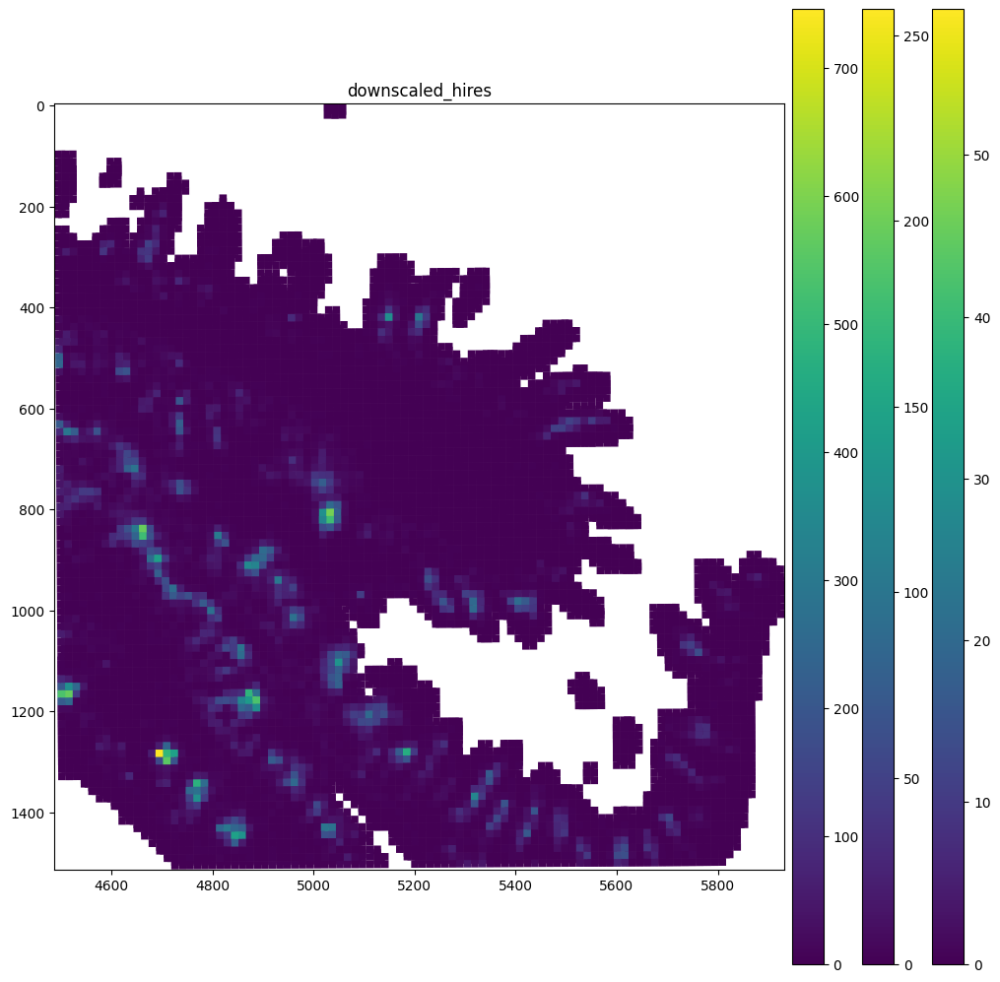

In [16]:
# sdata_visium_hd_crop.pl.render_shapes(color="Igha", method="matplotlib").pl.show(
#     "downscaled_hires", figsize=(10, 10)
# )

We can see that these bins are continous, so when overlaying the expression over an image, we would no longer see the image. To counter this, we will modify the colormap we'll use so that true 0s in the expression matrix are shown fully transparent. The spatialdata-plot library provides a helper function for this.

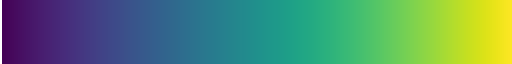

In [17]:
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent

cmap = set_zero_in_cmap_to_transparent(plt.cm.viridis)
cmap

We can now use this cmap to visualise the spatial expression of the genes. We see that the gene is only expressed in certain areas of the slide.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16513762..1.0].


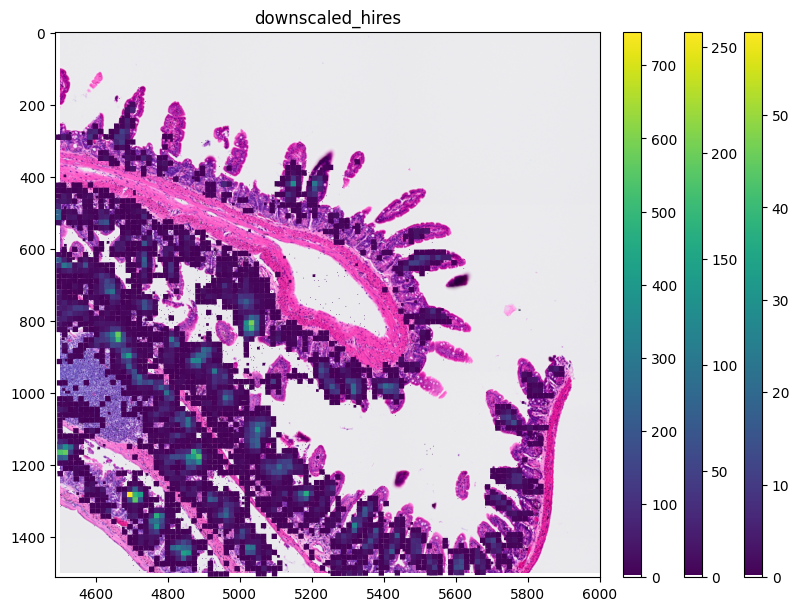

In [18]:
sdata_visium_hd_crop.pl.render_images().pl.render_shapes(
    color="Igha", method="matplotlib", cmap=cmap
).pl.show("downscaled_hires", figsize=(8, 6))

In [19]:
# Import necessary libraries
import spatialdata as sd
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent
import matplotlib.pyplot as plt

In [20]:
# Define a function to crop a specific region
def crop_region(sdata, min_coord, max_coord):
    return sdata.query.bounding_box(
        axes=["x", "y"],
        min_coordinate=min_coord,
        max_coordinate=max_coord,
        target_coordinate_system="global",
    )

Let’s now pre-compute a lazy-rasterized version of the data using `rasterize_bins()`. This operation takes just a few seconds and unlocks very fast on-demand channel-wise rasterization.

In [ ]:
%%time
from spatialdata import rasterize_bins

for bin_size in ["016", "008", "002"]:
    # rasterize_bins() requires a compresed sparse column (csc) matrix
    sdata_visium_hd.tables[f"square_{bin_size}um"].X = sdata_visium_hd.tables[f"square_{bin_size}um"].X.tocsc()
    rasterized = rasterize_bins(
        sdata_visium_hd,
        f"Visium_HD_Mouse_Small_Intestine_square_{bin_size}um",
        f"square_{bin_size}um",
        "array_col",
        "array_row",
    )
    sdata_visium_hd[f"rasterized_{bin_size}um"] = rasterized

This produces lazy image objects that can be accessed gene-wise exceptionally efficiently.

Importantly, these objects should not be computed as a whole, because this would lead to the unnecessary computation of hundreds of GB of memory.

In [ ]:
%%time
# this is very fast
sdata_visium_hd["rasterized_002um"].sel(c=gene_name).compute()
# this must not be called
# sdata["rasterized_002um"].compute()

Here is an example of how to plot the rasterized data. Please pay attention to setting scale="full"; this is essential. If it is not set, spatialdata-plot will try to re-rasterize the data to fit the canvas size and try to compute the whole object.

In [ ]:
%%time
plt.figure(figsize=(10, 10))
ax = plt.gca()

sdata_visium_hd.pl.render_images("rasterized_016um", channel=gene_name, scale="full").pl.show(coordinate_systems="global", ax=ax)

As you can see below, we can plot the 2µm bins very performantly, which would not be possible with the matplotlib based approach shown before.

Note: when we plot the full data below the plot appears as uniformly violet. This happens because the data is very sparse and the bins are too small for the target figure size; since most of the non-zero bins are 1s the final interpolated colors are very close to the zero value and difficult to see.

Let’s therefore:

change the limits of the plot to show a portion of the data to avoid interpolation artifacts

plot a binary mask of the full data to avoid the interpolated data to be to close to 0.

In [ ]:
from matplotlib.colors import ListedColormap

# define the colors for the colormap (black for zeros, white for > 0)
colors = ["#000000", "#ffffff"]  # Black, White
cmap = ListedColormap(colors)

plt.figure(figsize=(10, 10))

# bug: interpolation artifact, everything is black with a few sporadic white points: https://github.com/scverse/spatialdata-plot/issues/351
# ax = plt.gca()
# let's set a small vmax value so that the color is white also after interpolation
# sdata.pl.render_images("rasterized_002um", channel=gene_name, scale="full", vmin=0, vmax=0.01, cmap=cmap).pl.show(
# coordinate_systems="global", ax=ax
# )

# workaround
plt.imshow(sdata_visium_hd["rasterized_002um"].sel(c=gene_name).data.compute(), cmap=cmap, vmin=0, vmax=0.01)
plt.colorbar()

plt.show()

As a final not on the on-the-fly rasterization approach. Please, by looking at the corners of the last plot, notice how the data is on a grid that is actually sligthly rotated. The advantage of using rasterize_bins() is that the produced object contains the coordinate transformations necessary to align (rotation and scale) the rasterized data together with the high-resolution images.

In [ ]:
sdata_small = sdata_visium_hd.query.bounding_box(
    min_coordinate=[7000, 11000], max_coordinate=[10000, 14000], axes=("x", "y"), target_coordinate_system="global"
)

In [ ]:
gene_name = "AA986860"
sdata_small.pl.render_shapes("Visium_HD_Mouse_Small_Intestine_square_016um", color=gene_name).pl.show(
    coordinate_systems="global"
)

Notice how a Moiré pattern is visible. This is due to the fact that the grid is not axis-aligned but presents a small rotation. A solution is to switch to datashader as a backend (which is enabled by default when the number of geometries is large). This will create some artifacts (bins of different sizes, some “holes” in the plot), but generally is expected to mitigate the effects as opposed the plot above.

In [ ]:
gene_name = "AA986860"
sdata_small.pl.render_shapes(
    "Visium_HD_Mouse_Small_Intestine_square_016um", color=gene_name, method="datashader"
).pl.show(coordinate_systems="global")

In [ ]:
gene_name = "AA986860"

for bin_size in [16, 8, 2]:
    sdata_small.pl.render_shapes(
        f"Visium_HD_Mouse_Small_Intestine_square_{bin_size:03}um",
        color=gene_name,
        method="datashader",
    ).pl.show(coordinate_systems="global", title=f"bin_size={bin_size}µm", figsize=(10, 10))

The data present a lot of sparsity. Let’s remake the plots above by visualizing only the non-zero entries and using the full-resolution image as a background.

We will do this by modifying the viridis colormap so that 0 is plotted as transparent. Let’s also truncate the viridis colormap so that the highest value is colored green and not yellow since green has a better contrast against the pink of the H&E microscopy image.

In [ ]:
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent

# let's display the areas where no expression is detected as transparent
new_cmap = set_zero_in_cmap_to_transparent(cmap="viridis")
new_cmap

In [ ]:
gene_name = "AA986860"

for bin_size in [16, 8]:
    sdata_small.pl.render_images("Visium_HD_Mouse_Small_Intestine_full_image").pl.render_shapes(
        f"Visium_HD_Mouse_Small_Intestine_square_{bin_size:03}um", color=gene_name, cmap=new_cmap
    ).pl.show(coordinate_systems="global", title=f"bin_size={bin_size}µm", figsize=(10, 10))

Let’s make a zoomed version of the plot for the 2µm bins to better visualize them. Please notice that we pass method='matplotlib' as currently this is required in order to visualize the background as transparent by means of the modified colormap.

In [ ]:
from spatialdata import bounding_box_query

In [ ]:
crop1 = lambda x: bounding_box_query(
    x, min_coordinate=[9000, 11000], max_coordinate=[10000, 12000], axes=("x", "y"), target_coordinate_system="global"
)
crop1(sdata_small).pl.render_images("Visium_HD_Mouse_Small_Intestine_full_image").pl.render_shapes(
    "Visium_HD_Mouse_Small_Intestine_square_002um", color=gene_name, cmap=new_cmap, method="matplotlib"
).pl.show(coordinate_systems="global", title=f"bin_size=2µm", figsize=(10, 10))

As you can see the 8µm bins are convenient for looking at gene expression distribution from a broad perspective (same for the 16µm bins, where some resolution can be sacrificed in exchange for a faster visualization). On the other hand, the 2µm bins allow to precisely locate the expressed genes in the tissue.

Let’s now color the 16µm bins by cluster identity. Let’s reuse the clusters gene_expression_graphclust computed from 10x Genomics and available with the raw data from the 10x Genomics website.

In [ ]:
import os
from tempfile import TemporaryDirectory

import pandas as pd
import requests

# For convenience we rehost the single file containing the clusters we are interested in.
# Let's download it in a temporary directory and read it in a pandas DataFrame. The file is 2 MB.
clusters_file_url = "https://s3.embl.de/spatialdata/misc/visium_hd_mouse_intestine_16um_graphclust.csv"

with TemporaryDirectory() as tmpdir:
    path = os.path.join(tmpdir, "data.csv")
    response = requests.get(clusters_file_url)
    with open(path, "wb") as f:
        f.write(response.content)
    df = pd.read_csv(path)

In [ ]:
df.head(3)

In [ ]:
# let's convert the Cluster dtype from int64 to categorical since later we want the plots to use a categorical colormap
df["Cluster"] = df["Cluster"].astype("category")
df.set_index("Barcode", inplace=True)

Let’s merge the data.

In [ ]:
sdata_visium_hd["square_016um"].obs["Cluster"] = df["Cluster"]

Let’s plot the clusters on one of the data crops we used before.

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))  # Create a single axis
crop0 = lambda x: bounding_box_query(
    x, min_coordinate=[5000, 8000], max_coordinate=[10000, 13000], axes=("x", "y"), target_coordinate_system="global"
)
crop0(sdata_visium_hd).pl.render_images("Visium_HD_Mouse_Small_Intestine_full_image").pl.show(
    ax=ax, title="Full image", coordinate_systems="global"
)


In [ ]:
%%time
crop0(sdata_visium_hd).pl.render_images("Visium_HD_Mouse_Small_Intestine_full_image").pl.render_shapes(
    "Visium_HD_Mouse_Small_Intestine_square_016um", color="Cluster"
).pl.show(coordinate_systems="global", title=f"bin_size=016µm", figsize=(10, 10))

In [89]:
# Access the specific AnnData table
adata_table3 = sdata_visium_hd.tables["square_016um"]  # Replace "table_name" with the actual table name

# Make variable names unique
adata_table3.var_names_make_unique()

# Reassign the updated table back to the SpatialData object (optional if you need to reuse it)
sdata_visium_hd.tables["square_016um"] = adata_table3

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/spatialdata/_core/_elements.py:116: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


## QC experimental

In [45]:
sdata_visium_hd_crop = sdata_visium_hd.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[4500, 0],
    max_coordinate=[6000, 1500],
    target_coordinate_system="downscaled_hires",
)

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [46]:
# Access the specific AnnData table
adata_table3 = sdata_visium_hd_crop.tables["square_016um"]  # Replace "table_name" with the actual table name

# Make variable names unique
adata_table3.var_names_make_unique()

# Reassign the updated table back to the SpatialData object (optional if you need to reuse it)
sdata_visium_hd_crop.tables["square_016um"] = adata_table3

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/spatialdata/_core/_elements.py:116: UserWarning: Key `square_016um` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


In [76]:
# Check initial dimensions
print(f"Initial dataset dimensions: {sdata_visium_hd['square_016um'].shape}")

# Filter on-tissue spots
on_tissue_mask = sdata_visium_hd['square_016um'].obs['in_tissue'] == 1
sdata_visium_hd['square_016um'] = sdata_visium_hd['square_016um'][on_tissue_mask, :]

# Verify dimensions after filtering
print(f"Filtered dataset dimensions: {sdata_visium_hd['square_016um'].shape}")

Initial dataset dimensions: (175483, 32285)
Filtered dataset dimensions: (91033, 32285)


### 1. Mito-tracking

In [82]:
# Check the first 20 gene names in the dataset
print("First 20 gene names in the dataset:")
print(sdata_visium_hd['square_016um'].var.index[:20].tolist())

# Detect mitochondrial genes using prefixes (MT-, mt-, mt\-, etc.)
mito_genes_alt = sdata_visium_hd['square_016um'].var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)
print(f"Number of mitochondrial genes detected: {mito_genes_alt.sum()}")

# Extract and print the mitochondrial gene names
mito_genes_list = sdata_visium_hd['square_016um'].var.index[mito_genes_alt]
print("Mitochondrial genes detected:")
print(mito_genes_list.tolist())

First 20 gene names in the dataset:
['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587', 'Gm37323', 'Mrpl15', 'Lypla1', 'Tcea1', 'Rgs20', 'Gm16041', 'Atp6v1h', 'Oprk1', 'Npbwr1', 'Rb1cc1', '4732440D04Rik', 'Alkal1', 'St18']
Number of mitochondrial genes detected: 13
Mitochondrial genes detected:
['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt-Nd3', 'mt-Nd4l', 'mt-Nd4', 'mt-Nd5', 'mt-Nd6', 'mt-Cytb']


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/51257374.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = sdata_visium_hd['square_016um'].var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)


In [98]:
# Define the bin sizes
bin_sizes = ['square_002um', 'square_008um', 'square_016um']

# Iterate over each bin size in the dataset
for bin_size in bin_sizes:
    print(f"Processing bin: {bin_size}")
    
    # Get the AnnData object for the current bin
    adata = sdata_visium_hd[bin_size]
    
    # Check the first 20 gene names
    print(f"First 20 gene names in {bin_size}:")
    print(adata.var.index[:20].tolist())
    
    # Detect mitochondrial genes using prefixes (MT-, mt-, mt\-, etc.)
    mito_genes_alt = adata.var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)
    print(f"Number of mitochondrial genes detected in {bin_size}: {mito_genes_alt.sum()}")
    
    # Extract and print the mitochondrial gene names
    mito_genes_list = adata.var.index[mito_genes_alt]
    print(f"Mitochondrial genes detected in {bin_size}:")
    print(mito_genes_list.tolist())
    print("-" * 40)

Processing bin: square_002um
First 20 gene names in square_002um:
['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587', 'Gm37323', 'Mrpl15', 'Lypla1', 'Tcea1', 'Rgs20', 'Gm16041', 'Atp6v1h', 'Oprk1', 'Npbwr1', 'Rb1cc1', '4732440D04Rik', 'Alkal1', 'St18']
Number of mitochondrial genes detected in square_002um: 13
Mitochondrial genes detected in square_002um:
['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt-Nd3', 'mt-Nd4l', 'mt-Nd4', 'mt-Nd5', 'mt-Nd6', 'mt-Cytb']
----------------------------------------
Processing bin: square_008um
First 20 gene names in square_008um:
['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587', 'Gm37323', 'Mrpl15', 'Lypla1', 'Tcea1', 'Rgs20', 'Gm16041', 'Atp6v1h', 'Oprk1', 'Npbwr1', 'Rb1cc1', '4732440D04Rik', 'Alkal1', 'St18']
Number of mitochondrial genes detected in square_008um: 13
Mitochondrial genes detected in square_008um:
['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt

/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/3398731200.py:16: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = adata.var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)


In [83]:
# Mark mitochondrial genes in the var DataFrame
sdata_visium_hd['square_016um'].var['mt'] = mito_genes_alt

# Calculate per-spot QC metrics
from scanpy.preprocessing import calculate_qc_metrics
calculate_qc_metrics(
    sdata_visium_hd['square_016um'], 
    qc_vars=['mt'],  # Use the 'mt' column to flag mitochondrial genes
    percent_top=None, 
    log1p=False, 
    inplace=True
)

# Display mitochondrial metrics
print("Mitochondrial QC metrics:")
print(sdata_visium_hd['square_016um'].obs[['pct_counts_mt', 'total_counts', 'n_genes_by_counts']].head())

Mitochondrial QC metrics:
                       pct_counts_mt  total_counts  n_genes_by_counts
s_016um_00000_00000-1            0.0           4.0                  4
s_016um_00000_00001-1            0.0          10.0                  9
s_016um_00000_00002-1            0.0           8.0                  7
s_016um_00000_00003-1            0.0           5.0                  5
s_016um_00000_00004-1            0.0           4.0                  4


In [99]:
from scanpy.preprocessing import calculate_qc_metrics

# Define the bin sizes
bin_sizes = ['square_002um', 'square_008um', 'square_016um']

# Iterate over each bin size in the dataset
for bin_size in bin_sizes:
    print(f"Processing bin: {bin_size}")
    
    # Get the AnnData object for the current bin
    adata = sdata_visium_hd[bin_size]
    
    # Detect mitochondrial genes using prefixes
    mito_genes_alt = adata.var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)
    
    # Mark mitochondrial genes in the var DataFrame
    adata.var['mt'] = mito_genes_alt
    
    # Calculate per-spot QC metrics
    calculate_qc_metrics(
        adata, 
        qc_vars=['mt'],  # Use the 'mt' column to flag mitochondrial genes
        percent_top=None, 
        log1p=False, 
        inplace=True
    )
    
    # Display mitochondrial QC metrics
    print(f"Mitochondrial QC metrics for {bin_size}:")
    print(adata.obs[['pct_counts_mt', 'total_counts', 'n_genes_by_counts']].head())
    print("-" * 40)

Processing bin: square_002um


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/418435405.py:14: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = adata.var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)


Mitochondrial QC metrics for square_002um:
                       pct_counts_mt  total_counts  n_genes_by_counts
s_002um_00000_00008-1            0.0           1.0                  1
s_002um_00000_00013-1            0.0           1.0                  1
s_002um_00000_00014-1            0.0           1.0                  1
s_002um_00000_00015-1            0.0           2.0                  2
s_002um_00000_00025-1            0.0           1.0                  1
----------------------------------------
Processing bin: square_008um


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/418435405.py:14: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = adata.var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)


Mitochondrial QC metrics for square_008um:
                       pct_counts_mt  total_counts  n_genes_by_counts
s_008um_00000_00000-1            0.0           1.0                  1
s_008um_00000_00002-1            0.0           3.0                  3
s_008um_00000_00003-1            0.0           5.0                  4
s_008um_00000_00004-1            0.0           6.0                  6
s_008um_00000_00005-1            0.0           1.0                  1
----------------------------------------
Processing bin: square_016um


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/418435405.py:14: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = adata.var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)


Mitochondrial QC metrics for square_016um:
                       pct_counts_mt  total_counts  n_genes_by_counts
s_016um_00000_00000-1            0.0           4.0                  4
s_016um_00000_00001-1            0.0          10.0                  9
s_016um_00000_00002-1            0.0           8.0                  7
s_016um_00000_00003-1            0.0           5.0                  5
s_016um_00000_00004-1            0.0           4.0                  4
----------------------------------------


/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/3337662843.py:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


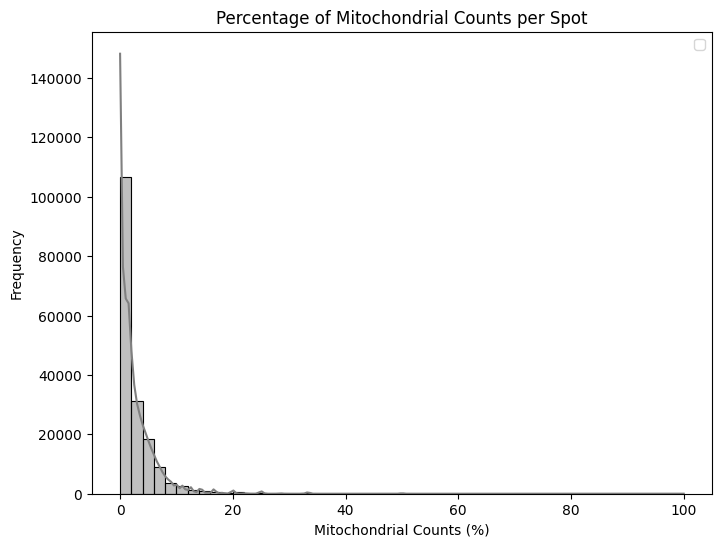

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.histplot(sdata_visium_hd["square_016um"].obs["pct_counts_mt"], kde=True, bins=50, color="gray")
# plt.axvline(20, color="red", linestyle="--", label="Threshold (20%)")
plt.title("Percentage of Mitochondrial Counts per Spot")
plt.xlabel("Mitochondrial Counts (%)")
plt.ylabel("Frequency")
plt.legend()
plt.show()

### 2. Total counts

In [30]:
# List all available elements in the SpatialData object
print(sdata_visium_hd)

# Check if 'total_counts' exists in any table
if 'square_016um' in sdata_visium_hd.tables:
    print("Columns in 'square_016um':")
    print(sdata_visium_hd['square_016um'].obs.columns)

SpatialData object, with associated Zarr store: /Users/georgegavriilidis/Downloads/data/visium_hd_zarr/data.zarr
├── Images
│     ├── 'Visium_HD_Mouse_Small_Intestine_cytassist_image': DataArray[cyx] (3, 3000, 3200)
│     ├── 'Visium_HD_Mouse_Small_Intestine_full_image': DataTree[cyx] (3, 21943, 23618), (3, 10971, 11809), (3, 5485, 5904), (3, 2742, 2952), (3, 1371, 1476)
│     ├── 'Visium_HD_Mouse_Small_Intestine_hires_image': DataArray[cyx] (3, 5575, 6000)
│     └── 'Visium_HD_Mouse_Small_Intestine_lowres_image': DataArray[cyx] (3, 558, 600)
├── Shapes
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um': GeoDataFrame shape: (5479660, 1) (2D shapes)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um': GeoDataFrame shape: (351817, 1) (2D shapes)
│     └── 'Visium_HD_Mouse_Small_Intestine_square_016um': GeoDataFrame shape: (91033, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (5479660, 19059)
      ├── 'square_008um': AnnData (351817, 19059)
      └── 'square_016u

/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/3325754802.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


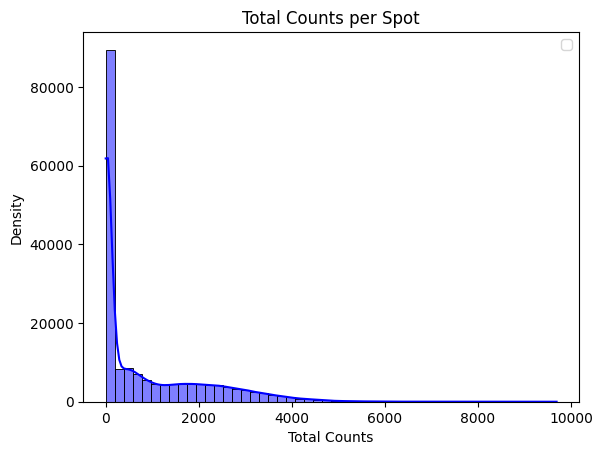

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt

# Access the 'total_counts' column from the appropriate table
total_counts = sdata_visium_hd['square_016um'].obs['total_counts']

# Define a threshold for low library size (adjust as necessary)
# low_library_size_threshold = 1000  # Example threshold

# Plot the histogram
sns.histplot(total_counts, kde=True, bins=50, color='blue')
# plt.axvline(low_library_size_threshold, color='red', linestyle='--', label='Threshold')
plt.title('Total Counts per Spot')
plt.xlabel('Total Counts')
plt.ylabel('Density')
plt.legend()
plt.show()

In [100]:
# Loop through all bin sizes in the SpatialData object
for bin_size in ["square_002um", "square_008um", "square_016um"]:
    print(f"\nProcessing bin size: {bin_size}")
    
    # Access the AnnData object for the current bin size
    adata = sdata_visium_hd[bin_size]
    
    # Access the 'total_counts' column
    if 'total_counts' in adata.obs.columns:
        total_counts = adata.obs['total_counts']
        
        # Display basic statistics for total counts
        print("Basic statistics for total counts per spot:")
        print(total_counts.describe())
        
        # Check the number of spots below a certain threshold
        low_library_size_threshold = 1000  # Example threshold
        low_library_spots = total_counts[total_counts < low_library_size_threshold]
        print(f"Number of spots below the threshold of {low_library_size_threshold}: {len(low_library_spots)}")
        print("Example spots with low total counts:")
        print(low_library_spots.head())
    else:
        print(f"'total_counts' column not found for bin size {bin_size}. Skipping.")


Processing bin size: square_002um
Basic statistics for total counts per spot:
count    7.111371e+06
mean     2.137656e+01
std      2.664677e+01
min      0.000000e+00
25%      3.000000e+00
50%      1.200000e+01
75%      3.000000e+01
max      6.740000e+02
Name: total_counts, dtype: float64
Number of spots below the threshold of 1000: 7111371
Example spots with low total counts:
s_002um_00000_00008-1    1.0
s_002um_00000_00013-1    1.0
s_002um_00000_00014-1    1.0
s_002um_00000_00015-1    2.0
s_002um_00000_00025-1    1.0
Name: total_counts, dtype: float32

Processing bin size: square_008um
Basic statistics for total counts per spot:
count    678597.000000
mean        224.015961
std         311.995819
min           0.000000
25%           4.000000
50%          47.000000
75%         377.000000
max        3055.000000
Name: total_counts, dtype: float64
Number of spots below the threshold of 1000: 658513
Example spots with low total counts:
s_008um_00000_00000-1    1.0
s_008um_00000_00002-1   

### 3. Genes

/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/31817896.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


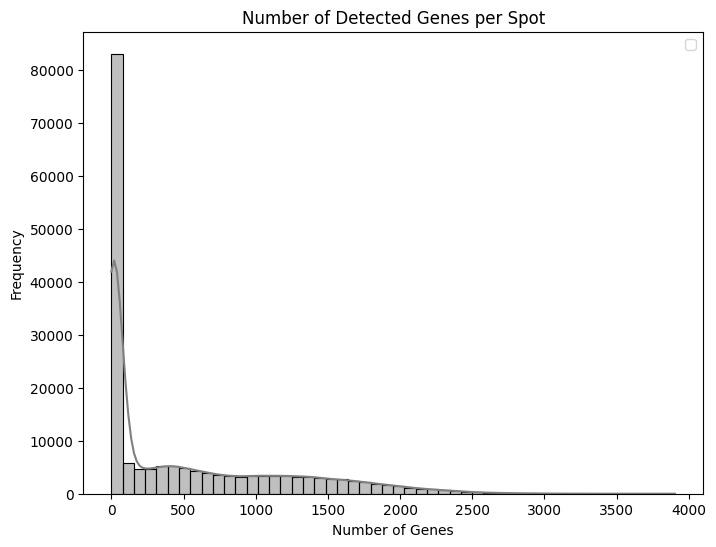

In [86]:
plt.figure(figsize=(8, 6))
sns.histplot(sdata_visium_hd["square_016um"].obs["n_genes_by_counts"], kde=True, bins=50, color="gray")
plt.title("Number of Detected Genes per Spot")
plt.xlabel("Number of Genes")
plt.ylabel("Frequency")
# plt.axvline(500, color="red", linestyle="--", label="Threshold (500 genes)")
plt.legend()
plt.show()

INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      
INFO     alpha component of given RGBA value for outline color is discarded, because outline_alpha takes precedent.
CPU times: user 5.35 s, sys: 71.3 ms, total: 5.42 s
Wall time: 5.4 s


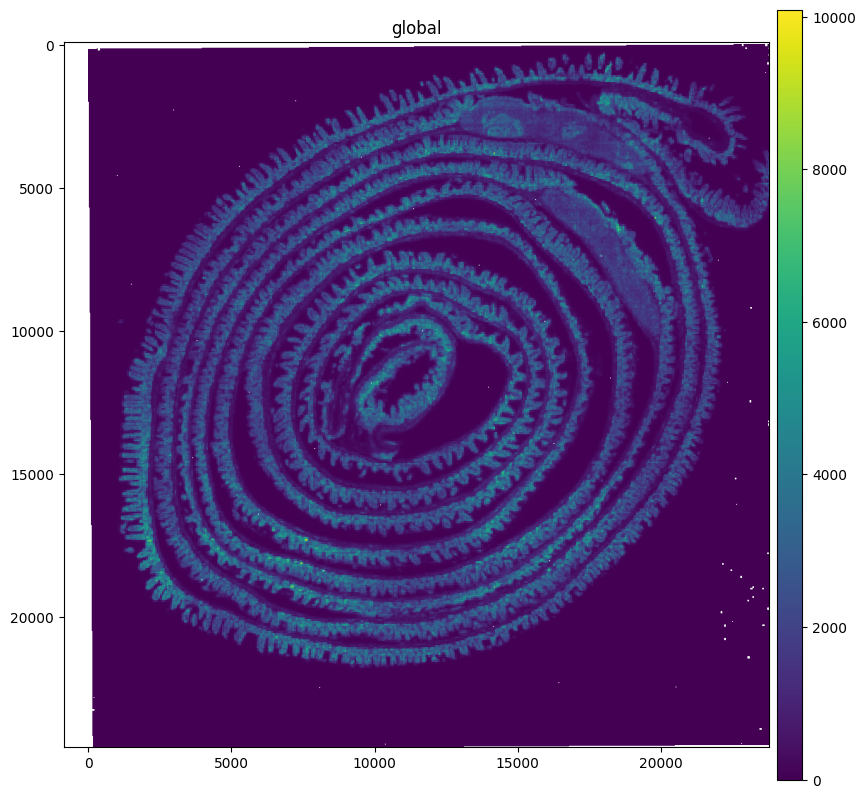

In [94]:
%%time
import matplotlib.pyplot as plt

# Create a figure for the plot
plt.figure(figsize=(10, 10))
ax = plt.gca()

# Plot library size (total counts) using the spatial data plotting method
sdata_visium_hd.pl.render_shapes(
    "Visium_HD_Mouse_Small_Intestine_square_016um",
    color="total_counts",  # Use total_counts for library size
    method="datashader"    # Efficient rendering for large datasets
).pl.show(
    coordinate_systems="global",
    ax=ax
)

/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      
INFO     alpha component of given RGBA value for outline color is discarded, because outline_alpha takes precedent.


/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/georgegavriilidis/spatialdata_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' do disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      
INFO     alpha component of given RGBA value for outline color is discarded, because outline_alpha takes precedent.


Text(0.5, 1.0, 'Percentage of Mitochondrial Reads')

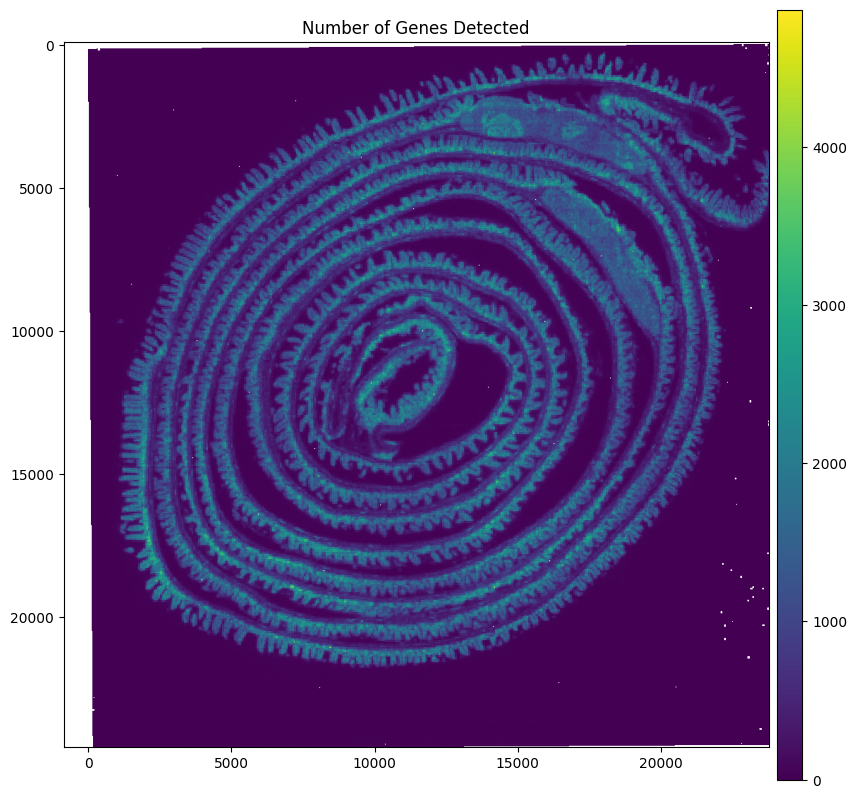

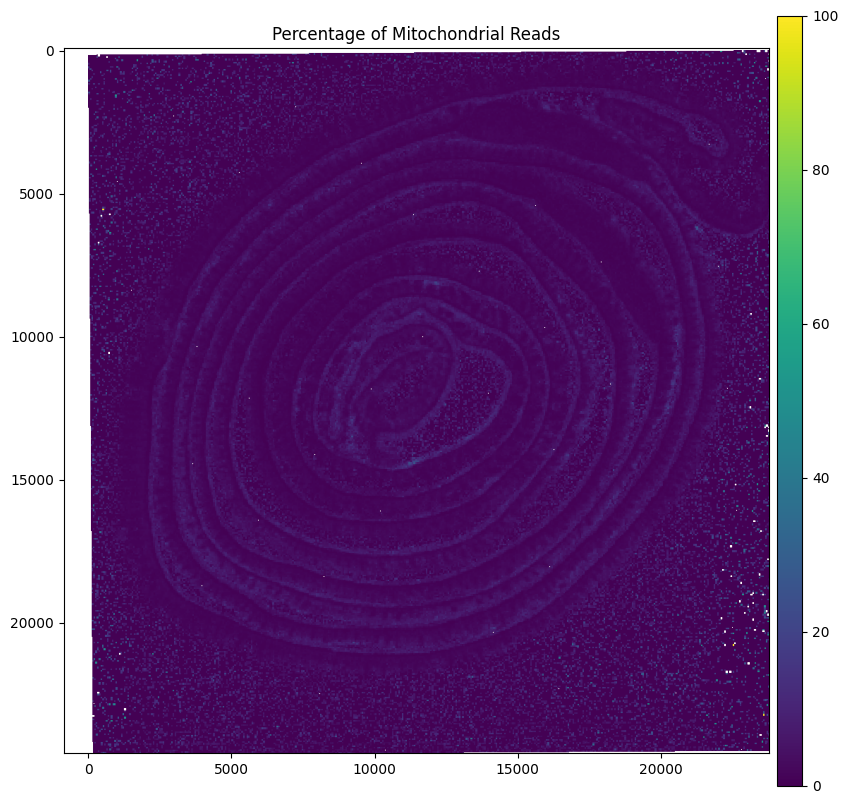

In [92]:
import matplotlib.pyplot as plt

# Plot number of genes detected (n_genes_by_counts)
plt.figure(figsize=(10, 10))
ax = plt.gca()
sdata_visium_hd.pl.render_shapes(
    "Visium_HD_Mouse_Small_Intestine_square_016um",
    color="n_genes_by_counts",  # Column for number of genes detected
    method="datashader"
).pl.show(
    coordinate_systems="global",
    ax=ax
)
plt.title("Number of Genes Detected")

# Plot mitochondrial content (pct_counts_mt)
plt.figure(figsize=(10, 10))
ax = plt.gca()
sdata_visium_hd.pl.render_shapes(
    "Visium_HD_Mouse_Small_Intestine_square_016um",
    color="pct_counts_mt",  # Column for mitochondrial percentage
    method="datashader"
).pl.show(
    coordinate_systems="global",
    ax=ax
)
plt.title("Percentage of Mitochondrial Reads")


In [95]:
# cut offs???

In [101]:
import pandas as pd

# Define bin sizes and corresponding keys
bin_sizes = ["square_002um", "square_008um", "square_016um"]
metrics = {}

# Extract metrics for each bin size
for bin_size in bin_sizes:
    adata = sdata_visium_hd[bin_size]
    metrics[bin_size] = pd.DataFrame({
        "total_counts": adata.obs["total_counts"],
        "n_genes_by_counts": adata.obs["n_genes_by_counts"],
        "pct_counts_mt": adata.obs["pct_counts_mt"],
    })

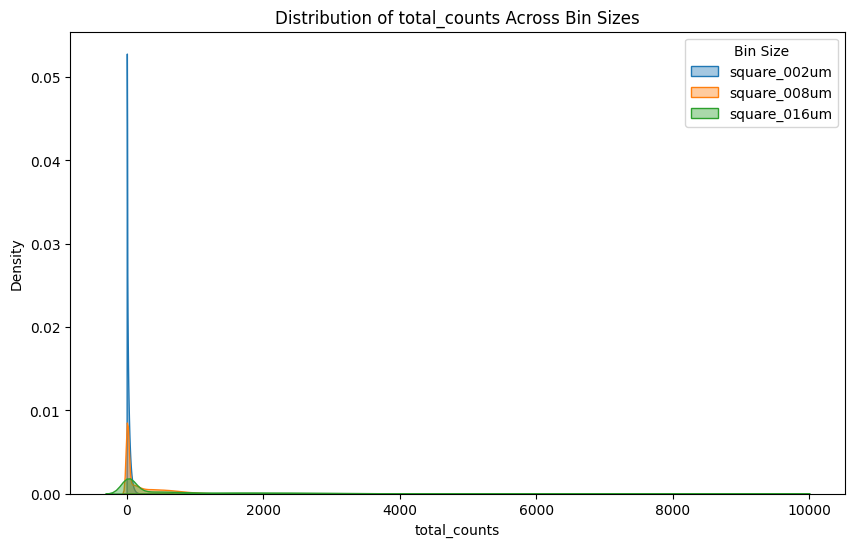

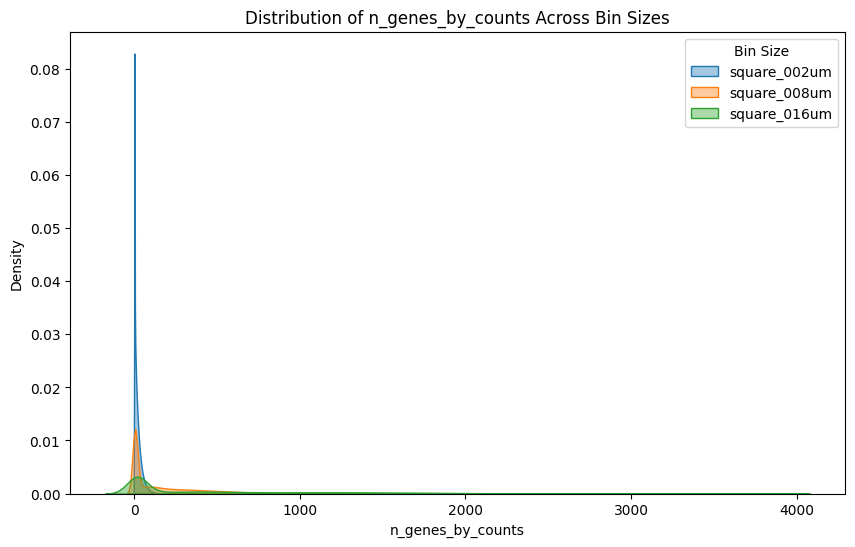

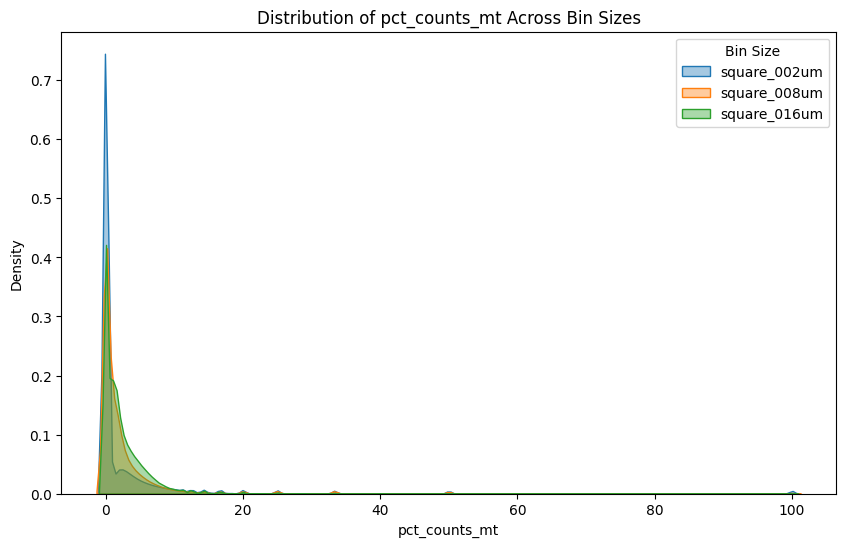

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

for metric in ["total_counts", "n_genes_by_counts", "pct_counts_mt"]:
    plt.figure(figsize=(10, 6))
    for bin_size in bin_sizes:
        sns.kdeplot(metrics[bin_size][metric], label=bin_size, fill=True, alpha=0.4)
    plt.title(f"Distribution of {metric} Across Bin Sizes")
    plt.xlabel(metric)
    plt.ylabel("Density")
    plt.legend(title="Bin Size")
    plt.show()

/var/folders/hr/f3msc_bs3z53n3_m4c4ry6tc0000gn/T/ipykernel_1180/1597494356.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=combined_data, x="bin_size", y="total_counts", palette="Set2")


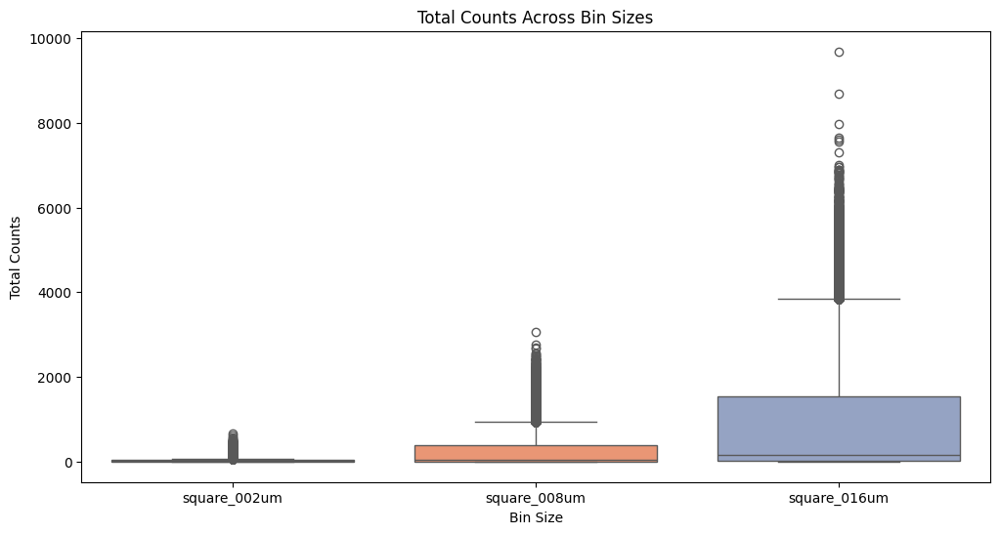

In [103]:
# Combine data for boxplot
combined_data = pd.concat(
    [metrics[bin_size].assign(bin_size=bin_size) for bin_size in bin_sizes]
)

# Create boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(data=combined_data, x="bin_size", y="total_counts", palette="Set2")
plt.title("Total Counts Across Bin Sizes")
plt.xlabel("Bin Size")
plt.ylabel("Total Counts")
plt.show()

In [104]:
for metric in ["total_counts", "n_genes_by_counts", "pct_counts_mt"]:
    print(f"Variance of {metric} across bin sizes:")
    for bin_size in bin_sizes:
        variance = metrics[bin_size][metric].var()
        print(f"  {bin_size}: {variance:.2f}")

Variance of total_counts across bin sizes:
  square_002um: 710.05
  square_008um: 97341.38
  square_016um: 1390420.75
Variance of n_genes_by_counts across bin sizes:
  square_002um: 513.89
  square_008um: 47269.61
  square_016um: 426204.75
Variance of pct_counts_mt across bin sizes:
  square_002um: 76.92
  square_008um: 42.12
  square_016um: 12.94
